In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import glob
import os
import peakutils
import logging
import datetime
import warnings
from lmfit.models import PseudoVoigtModel, GaussianModel
from jupyterthemes import jtplot

In [2]:
from xps.xps_sw import *
from xps.xps_import import *
from xps.xps_analysis import *
from xps.xps_bg import *
from xps.xps_fits import *

jtplot.style('default', grid=False)
logging.getLogger().setLevel(logging.CRITICAL)
warnings.filterwarnings("ignore")

plt.rcParams['errorbar.capsize'] = 8
plt.rcParams['font.size'] = 18
plt.rc('font', size= 18)
plt.rc('legend', fontsize= 15)
plt.rc('xtick', labelsize= 18)
plt.rc('ytick', labelsize= 18)
plt.rc('axes', labelsize=18)
plt.rc('axes', titlesize=18)
plt.rcParams["xtick.major.size"] = 8

plt.rcParams['lines.linewidth'] = 4
asf = dict({'C_1s' : 0.296, 'O_1s' : 0.711, 'N_1s' : 0.477, 'Ba_3d' : 7.49,
            'Br_3p' : 1.054, 'Cu_2p' : 5.321, 'Ba_4d': 2.35, 'Na_1s' : 1.685,
           'In3d' : 4.359, 'Sn3d' : 4.725, 'Cl_2p' : 0.891, 'Si2p': 0.339})

In [3]:
#asf3 = {'C_1s' : 1.0, 'O_1s' : 2.93, 'N_1s' : 1.80, 'Ba_3d' : 64.3,
#         'Ba_3d_3/2' : 49.9, 'Ba_4d': 5.86, 'Cl_2p' : 2.28, 'Cl_2s': 1.50}

asf2 = {'C_1s' : 1.0, 'O_1s' : 2.93, 'N_1s' : 1.80, 'Ba_3d' : 25.84, 'Na_1s' : 8.25,
        'Ba_3d_3/2' : 25.84, 'Ba_4d': 5.86, 'Cl_2p' : 2.28, 'Cl_2s': 1.69}

In [4]:
plt.rcParams['axes.grid'] = True
plt.rcParams['axes.grid.which'] = 'major'
plt.rcParams['axes.grid.axis'] = 'x'

In [5]:
def plot_region(xp : XPS_experiment, region : str, col: str = None, lb : str = None, ax = None, offset: float = 0.):
    """Quick region plotter"""
    if lb == None: lb = xp.name
    if ax == None: ax = plt.gca()
#     offset *= np.average(xp.dfx[region].dropna().counts.values)
    p1 = ax.plot(xp.dfx[region].energy, xp.dfx[region].counts + offset, label=lb)
    
    if col != None:
        p1[0].set(color=col)
    elif xp.color :
        p1[0].set(color=xp.color)

    if xp.ls:
        p1[0].set(linestyle=xp.ls)

    cosmetics_plot()
    return p1[0]

def plot_xp_regions(experiments : list, regions : list, colors : list = [], ncols: int = 3, flag_shift: bool = False):
    """Subplots all regions of a list of experiments (unnormalised)"""
    rows = int(np.ceil(len(regions) / ncols))

    fig, ax = plt.subplots(rows, ncols, figsize=(16, 8))
    fig.add_subplot(111, frameon=False, xticks=[], yticks=[])  # Used for common xlabel and ylabel

    for i,r in enumerate(regions):
        enmx, comx = [], [] # Peak point lists
        for c,xp in enumerate(experiments):
            j, k = i//ncols, i%ncols

            if i == len(regions) - 1:   # Set labels from last region
                lb = xp.name

            else:
                lb='__nolabel__'

            try:
                li = plot_region(xp, r, ax=ax[j][k], lb=lb)
                ax[j][k].legend()
                ax[j][k].invert_xaxis()
            except KeyError:    # Auto-exclude regions not recorded for a particular experiment
                pass
            if flag_shift:
                argmx = np.argmax(xp.dfx[r].counts)
                enmx.append(xp.dfx[r].energy.loc[argmx])
                comx.append(xp.dfx[r].counts.loc[argmx])

        ax[j][k].set_title(r.replace('_', ' '))
        ax[j][k].set_yticks([])
        if flag_shift:  ax[j][k].plot(enmx, comx, '--k', lw=2.5)

        if len(experiments)%2 == 0:
            ax[j][k].invert_xaxis()
    plt.xlabel('\nEnergy [eV]', ha='center')
    plt.ylabel(None)
    
    ax[0][0].set(ylabel='Intensity [A.U.]')
    plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
    return ax

def plot_fit_result(xp: XPS_experiment, region: str, fitRes: ModelResult = None,
                    lb : str = None, ax = None, col:str = None, offset: float = 0.3,
                    plot_comps: bool = True, flag_fill: bool = False):
    if ax == None : ax = plt.gca()
    if col == None: col = xp.color
    if lb == None: lb = xp.name
    if fitRes == None: fitRes = xp.fit[region]
        
    offset *= np.average(xp.dfx[region].dropna().counts.values)
    p1 = ax.scatter(xp.dfx[region].energy, xp.dfx[region].counts + offset,
                    color=col, label=lb, zorder = 1)

    x = xp.dfx[region].dropna().energy

    ax.plot(x, fitRes.best_fit + offset, '-', color=col)#, label='best fit, $\chi^2_N$ = %i' %fitRes.redchi)
#     ax.legend(loc='upper left')

    if plot_comps:
        comps = fitRes.eval_components(x=x)
        for compo in comps:
            posx = fitRes.best_values[compo+'center']
            colc = ax.plot(x, comps[compo], ls='dotted', lw=2, color=col, label='__nolabel__')[0].get_color()

            ax.vlines(x=posx, ymin=0, ymax=comps[compo].max(), linestyle='-', colors=col)
            ax.text(x=posx, y=comps[compo].max()*0.9, s='%.1f' %posx, fontsize=12)
            if flag_fill:
                ax.fill_between(x, y1 = 0, y2 = comps[compo], alpha=0.3, color=col)

    return ax, offset

def table_fit_area(exps: list, region: str):
    """Print a table with fit results and relative areas dict"""
    par_table = ['center', 'fwhm', 'amplitude', 'area']
    head = 'comp\t'

    for par in par_table: 
        head += '%s\t'%par

    print(head)

    for xp in exps:
        fit = xp.fit[region]
        for i, comp in enumerate(fit.components):
            pref = comp.prefix
            line = pref[:-1] + '\t'

            for par in par_table[:-1]:
                line += '%.2f\t '%fit.values[pref + par]        
            line += '%.2f'%xp.area[region+'_'+pref]

            print(line)

In [6]:
def n_layers(xpf: XPS_experiment, xp0: XPS_experiment, r_ml: float, region: str, mfp: float, takeoff: float):
    """Estimate number of layers from the attenuation in substrate (region) between an experiment
    with the layer xpf and a reference (clean) experiment xp0.
    For uncorrected thickness estimation (in nm), use function layer_thickness.
    Parameters:
    ------------
    - xpf: Experiment with substrate CL attenuated by layer.
    - xp0: Clean experiment for reference.
    - r_ml: Size of a Monolayer, in the same units as mfp
        (if the attenuation corresponds to sub-ML regime, correct for bare substrate contribution)
    - region: substrate region.
    - mfp: mean free path of the molecule conforming the layer (use QUASES to compute it).
        NOTE: Use EAL to account for elastic scattering, if negligible use IMFP.
    - takeoff: angle in degrees between the surface normal and the analyser entry.

    Returns:
    layers, dlayers: number layer and associated error
    -----------
    """
    #from invisible_cities.core.system_of_units import nm

    try:
        If = xpf.area[region]
        I0 = xp0.area[region]

    except KeyError:
        If = np.trapz(xpf.dfx[region].dropna().counts, dx=0.1)
        I0 = np.trapz(xp0.dfx[region].dropna().counts, dx=0.1)

    dIf = np.sqrt(If)
    dI0 = np.sqrt(I0)

    costh = np.cos(takeoff*np.pi/180)

    thick = mfp*costh*np.log(I0/If)
    dthick = mfp*costh*np.sqrt((dI0/I0)**2 + (dIf/If)**2)

    if thick < r_ml:
        layers = (If/I0 - 1) / (np.exp(- r_ml * costh / mfp) - 1)
        dlayers = layers * np.sqrt( (dIf/If)**2 + (dI0/I0)**2 )
    else:
        layers = thick / r_ml
        dlayers = dthick / r_ml

    xpf.area.update({'layers' : layers})
    xpf.area.update({'dlayers' : dlayers})

    return layers, dlayers

def arrange_coverages(experiments: list, inds: list,
                      r_ml: float, region: str, mfp: float, takeoff: float)->np.matrix:
    """Estimate n_layers for a list of experiments following the indices inds
    Parameters:
     - experiments: list of XPS_experiment to look into
     - inds: list of indices. It must be arranged such that each set of measurements
             has its reference (clean substrate) index at the end of each list.
             Example:  inds = [[0,1,2,3,5,7,8, 4], [9, 10]]
             will take experiments[4] as clean_substrate, and compute the thickness of experiments[0],
             experiments[1], experiments[2]... Then it will take experiments[10] as clean_substrate and
             compute the thickness for experiments[9]
     - all other params must be passed as for n_layers
    Returns:
    layers_res: matrix (M x 2), with column 0 is the mean value of n_layers and column 1 its error, and
    where M is the number of experiments passed for computation.
    """
    layers_res = []
    for lref in inds:
        for li in lref[:-1]:
            lay, dlay = n_layers(xpf=experiments[li], xp0=experiments[lref[-1]],
                                           r_ml = r_ml, region=region, mfp=mfp, takeoff=takeoff) 
            experiments[li].area['layers'] = lay
            experiments[li].area['dlayers'] = dlay
            
            layers_res.append((lay, dlay))
    layers_res = np.matrix(layers_res)
    return layers_res

def plot_coverages(experiments, label='__nolabel__'):
    layers, dlayers = [], []
    names = []
    for xp in experiments:
        try:
            layers.append(xp.area['layers'])
            dlayers.append(xp.area['dlayers'])
            names.append(xp.name.replace('_', ' ') )
        except KeyError:
            pass

    ax = plt.gca()
    ax.errorbar(x=layers, xerr=dlayers, y=names, fmt='o', markersize=10, label=label)
    ax.set_xlabel('Layers')
    ax.legend()

# Sample 2 from May 10th, FBI-BaCl2

In [25]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/**/*.uxy'

files = glob.glob(path, recursive=True)
files.sort()
file_clean = files[-1]
files[1:] = files[:-1]
files[0] = file_clean
files

['/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/proc/20210510_Au111_clean2.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/proc/20210510_Au111_FBI_subl_30min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/proc/20210510_Au111_FBI_subl_30min_BaCl2_30s.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/proc/20210510_Au111_FBI_subl_30min_BaCl2_60s.uxy']

In [26]:
samp2 = [read_processed_xp(f) for f in files]
cols = ['r', 'g', 'b', 'y']
for xp, c in zip(samp2, cols):
    xp.color = c

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/proc/20210510_Au111_clean2.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/proc/20210510_Au111_FBI_subl_30min_BaCl2_60s.uxy.ft', returning empty fit dict


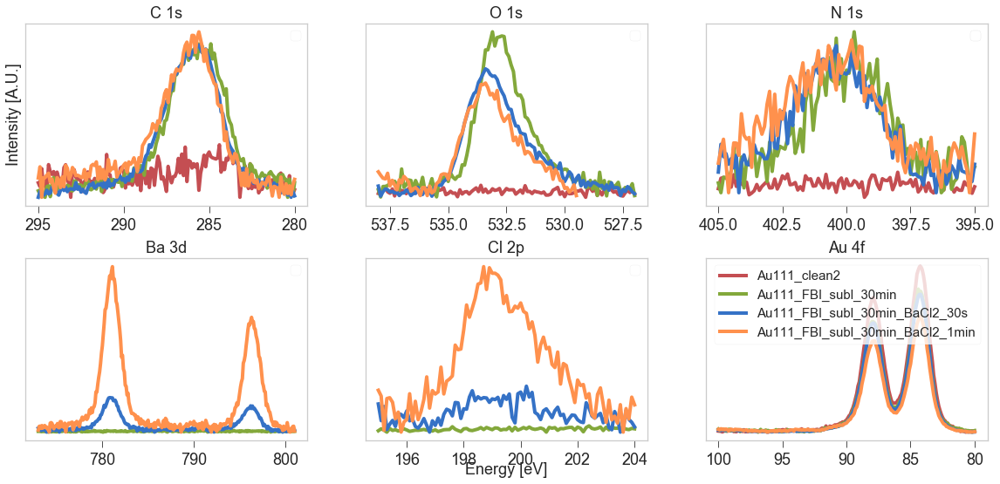

In [8]:
regs = ['C_1s', 'O_1s', 'N_1s', 'Ba_3d', 'Cl_2p', 'Au_4f']

plot_xp_regions(samp2, regs, ncols=3);
# plt.gcf().savefig('/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_26_Cu/Unscaled_exps.png', dpi=200)

## Raw data plot

In [9]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/**/*.xy'

files = glob.glob(path, recursive=True)
files.sort()
file_clean = files[-1]
files[1:] = files[:-1]
files[0] = file_clean
files

['/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_clean2.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_FBI_subl_30min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_FBI_subl_30min_BaCl2_30s.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_FBI_subl_30min_BaCl2_60s.xy']

In [10]:
raw2 = [xps_data_import(f) for f in files]
cols = ['r', 'g', 'b', 'y']
for xp, c in zip(raw2, cols):
    xp.color = c

In [11]:
trim_spectra(raw2[2], raw2[0], 'N_1s', inplace=True)
for xp in raw2[:3]:
    trim_spectra(xp, raw2[3], 'O_1s', inplace=True)

for xp in raw2:
    crop_spectrum(xp, 'O_1s', edw=529, inplace=True)

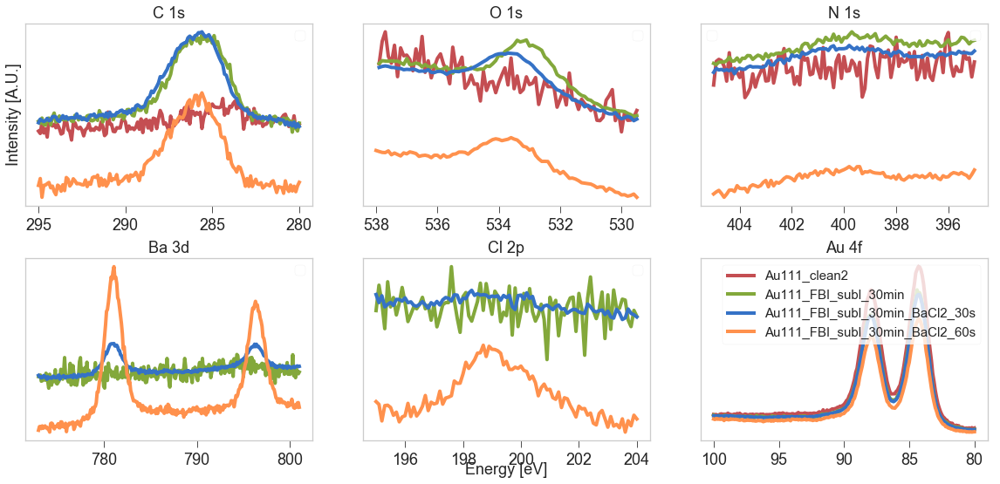

In [12]:
regs = ['C_1s', 'O_1s', 'N_1s', 'Ba_3d', 'Cl_2p', 'Au_4f']

plot_xp_regions(raw2, regs, ncols=3);
# plt.gcf().savefig('/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_26_Cu/Unscaled_exps.png', dpi=200)

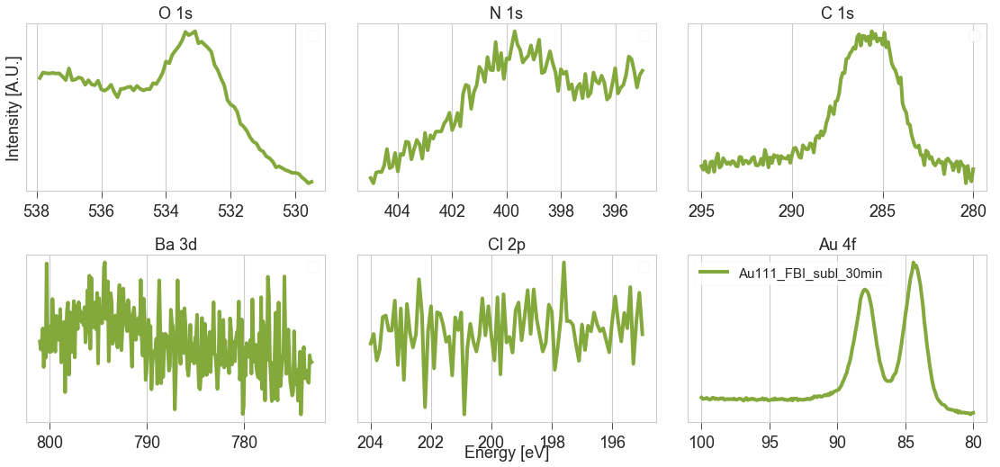

In [105]:
regs = ['O_1s', 'N_1s', 'C_1s', 'Ba_3d', 'Cl_2p', 'Au_4f']

plot_xp_regions([raw2[1]], regs, ncols=3);
plt.tight_layout()

# plt.gcf().savefig('/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_26_Cu/Unscaled_exps.png', dpi=200)

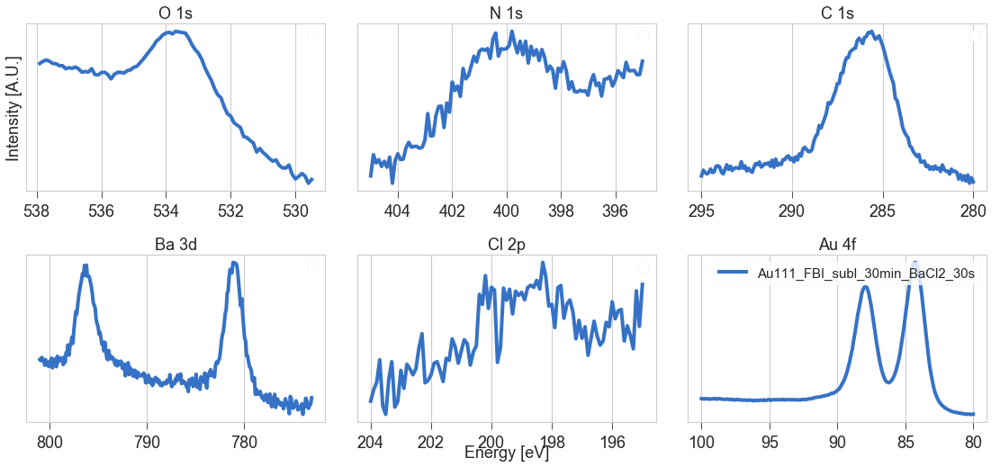

In [104]:

plot_xp_regions([raw2[2]], regs, ncols=3);
plt.tight_layout()
# plt.gcf().savefig('/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_26_Cu/Unscaled_exps.png', dpi=200)

In [154]:
trim_spectra(raw1[2], raw2[3], 'O_1s', inplace=True);

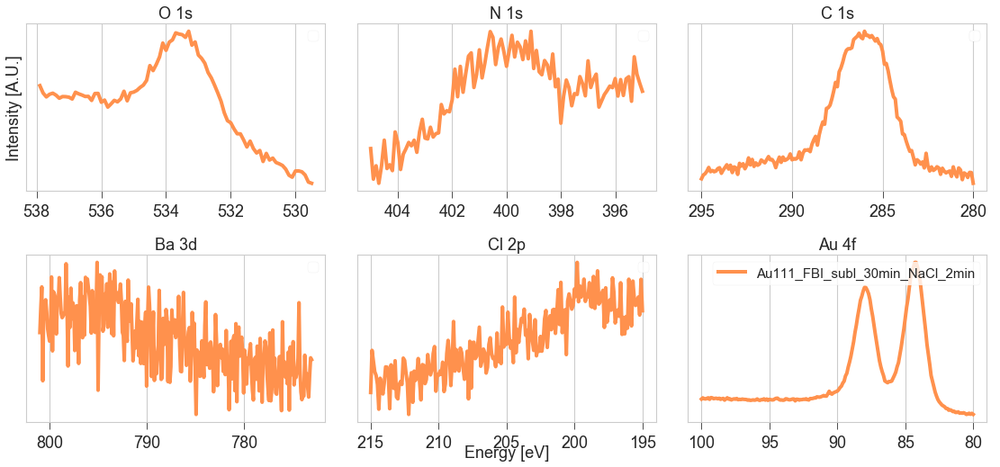

In [155]:
regs = ['O_1s', 'N_1s', 'C_1s', 'Ba_3d', 'Cl_2p', 'Au_4f']

plot_xp_regions([raw1[2]], regs, ncols=3);
plt.tight_layout()

# plt.gcf().savefig('/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_26_Cu/Unscaled_exps.png', dpi=200)

## Proper reference subtraction from Au clean

In [212]:
trim_spectra(samp2[0], samp2[1], 'O_1s', inplace=True)
trim_spectra(samp2[2], samp2[1], 'N_1s', inplace=True);

In [97]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/**/*.xy'

rawfiles = glob.glob(path, recursive=True)
rawfiles.sort()
rawfile_clean = rawfiles[-1]
rawfiles[1:] = rawfiles[:-1]
rawfiles[0] = rawfile_clean
rawfiles

['/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_clean2.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_FBI_subl_30min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_FBI_subl_30min_BaCl2_30s.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_FBI_subl_30min_BaCl2_60s.xy']

In [98]:
rawxps = [xps_data_import(f) for f in rawfiles]
cols = ['r', 'g', 'b', 'y']
for xp, c in zip(rawxps, cols):
    xp.color = c

In [99]:
trim_spectra(rawxps[0], rawxps[1], 'O_1s', inplace=True);

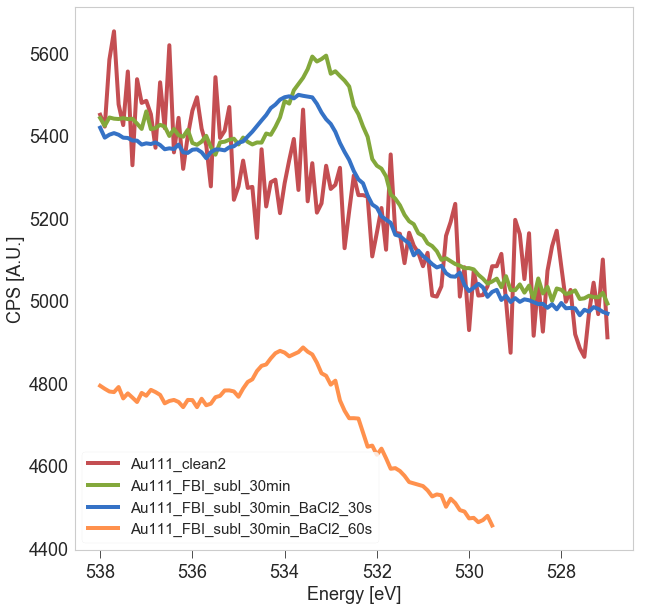

In [203]:
smooth = gaussian_smooth(rawxps[0], 'O_1s', sigma=2)
# plot_region(smooth, 'O_1s')

plt.figure(figsize=(10,10))
plot_region(rawxps[0], 'O_1s')
plot_region(rawxps[1], 'O_1s')
plot_region(rawxps[2], 'O_1s')
plot_region(rawxps[3], 'O_1s')
plt.gca().invert_xaxis()

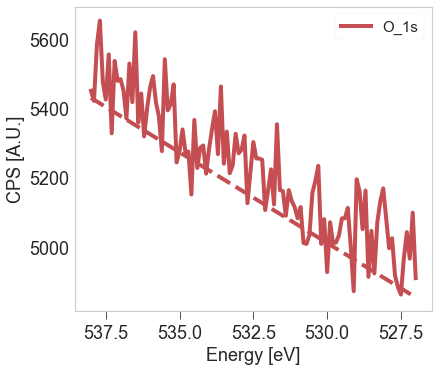

In [204]:
subtract_linear_bg(rawxps[0], 'O_1s');

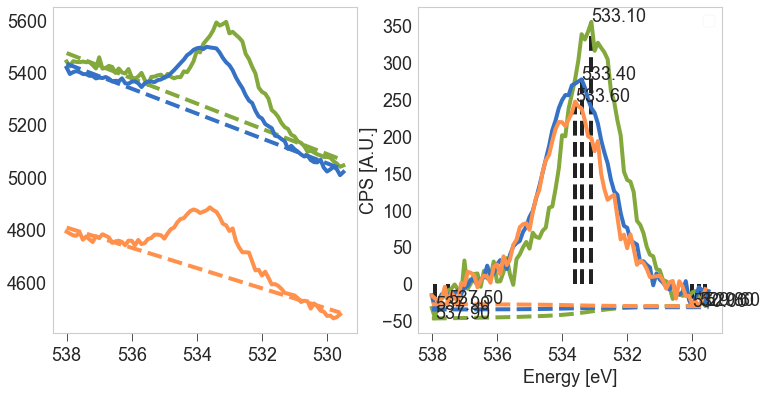

In [100]:
bg_exps = []
fig, ax = plt.subplots(1, 2, sharex=True, figsize=(12, 6))
for xp in rawxps[1:]:
    bgxp = crop_spectrum(xp, 'O_1s', edw=529.5)    
    bgxp = subtract_linear_bg(bgxp, 'O_1s', ax=ax[0])
    bgxp = subtract_shirley_bg(bgxp, 'O_1s', maxit=100, ax=ax[1])
#     fix_tail_bg(bgxp, 'O_1s', eup=530.6, inplace=True, ax=ax[2])
    bg_exps.append(bgxp)
ax[1].invert_xaxis()

Modify user pars


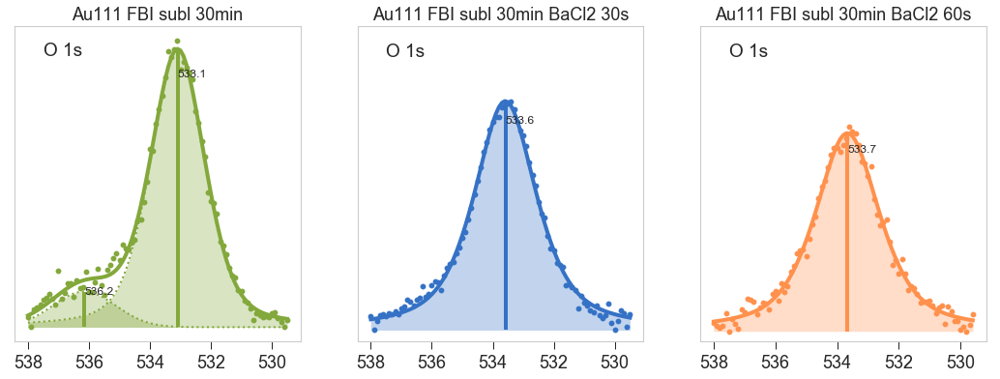

In [101]:
fig, ax = plt.subplots(1, 3, sharex=False, figsize=(18, 6), )

r = 'O_1s'
for i, xp in enumerate(bg_exps):
    xp.area, xp.fit = {}, {}
    Fn = XPFit(xp, region = r)
    if i == 0: 
        Fn.preset_pars('v2_sigma', 1.21431795)
        Fn.double_voigt(sepPt=533.5)
    else: Fn.voigt()
    Fn.set_areas()
    plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[i], offset=0,
                    flag_fill=True, plot_comps=True)
    ax[i].set(title=xp.name.replace('_', ' '), xlabel='', ylabel='', yticks=[], 
                 ylim=(ax[i].get_ylim()[0], ax[0].get_ylim()[1]))
    ax[i].invert_xaxis()
    ax[i].tick_params('both', length=8, width=1, which='major')
    ax[i].text(s='O 1s', x=537.5, y=ax[0].get_ylim()[1]*0.9, fontsize=19)


Text(537, 405.15692651634777, 'O 1s')

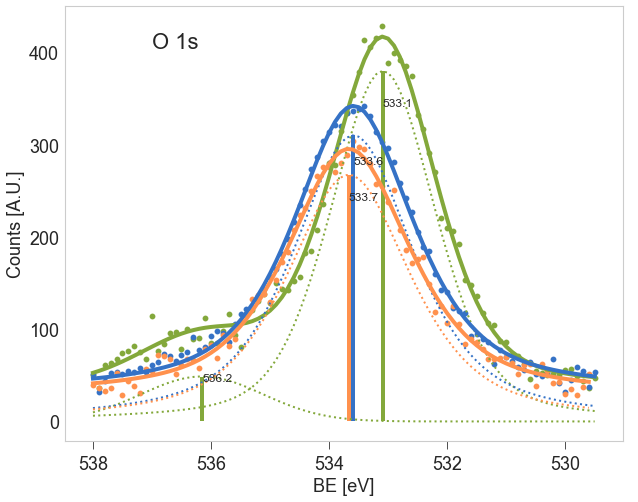

In [207]:
region = 'O_1s'
plt.figure(figsize=(10, 8))
plot_fit_result(bg_exps[0], region)
plot_fit_result(bg_exps[1], region)
plot_fit_result(bg_exps[2], region)

plt.gca().invert_xaxis()
plt.gca().set(xlabel='BE [eV]', ylabel='Counts [A.U.]')
plt.gca().text(s='O 1s', x=537, y=plt.gca().get_ylim()[1] * 0.9, fontsize=22)

Text(537, 405.15692651634777, 'O 1s')

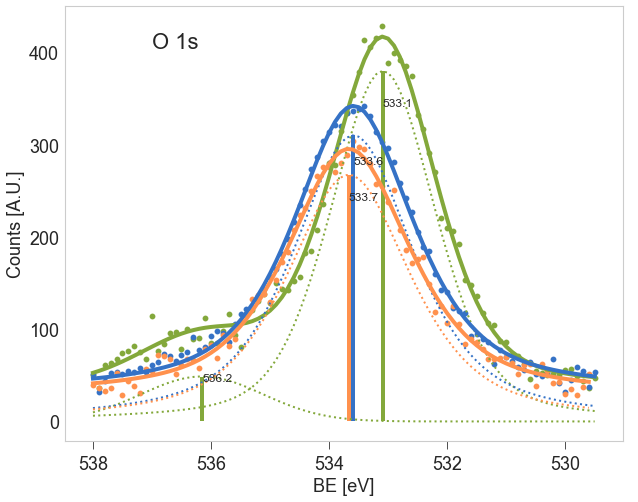

In [208]:
region = 'O_1s'
plt.figure(figsize=(10, 8))
plot_fit_result(bg_exps[0], region)
plot_fit_result(bg_exps[1], region)
plot_fit_result(bg_exps[2], region)

plt.gca().invert_xaxis()
plt.gca().set(xlabel='BE [eV]', ylabel='Counts [A.U.]')
plt.gca().text(s='O 1s', x=537, y=plt.gca().get_ylim()[1] * 0.9, fontsize=22)

In [102]:
r = 'O_1s'
samp2[1].dfx[r] = bg_exps[0].dfx[r]
samp2[2].dfx[r] = bg_exps[1].dfx[r]
samp2[3].dfx[r] = bg_exps[2].dfx[r]

## Stoichiometry

In [71]:
samp3[4].dfx['Ba_3d'].energy.min(), samp3[4].dfx['Ba_3d'].energy.max()

(776.0, 784.0)

'Ba_3d' region does not exist in Au111_clean2
'Cl_2p' region does not exist in Au111_clean2
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area


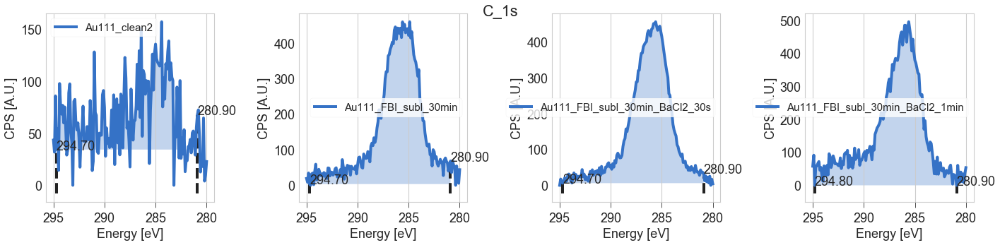

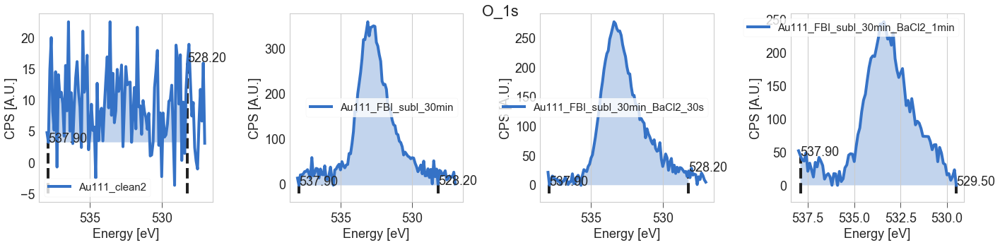

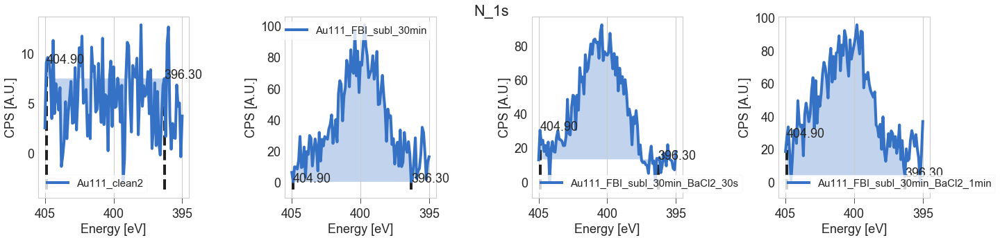

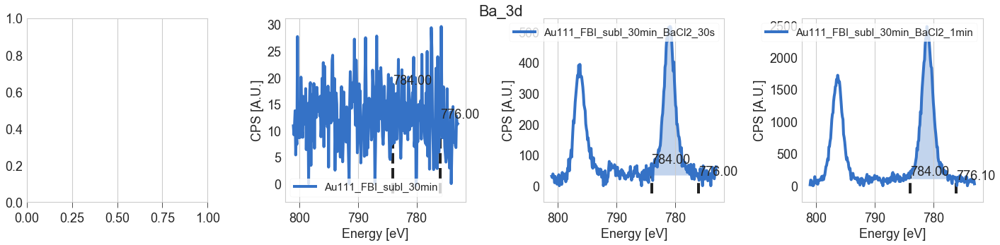

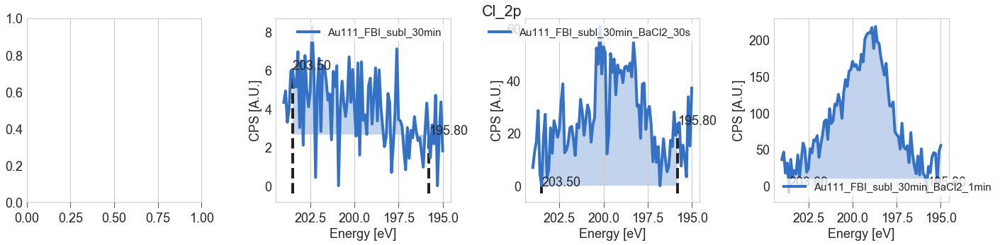

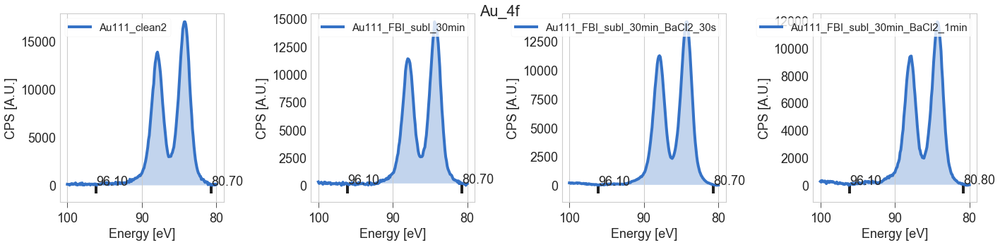

In [75]:
for r in regs:
    eup, edw = None, None
    if r == 'Ba_3d': eup, edw = 784.0, 776.0
    integrateRegions(samp2, r, asf=asf2, eup=eup, edw=edw)

In [77]:
for xp in samp2:
    xp.area['FBI0'] = xp.area['N_1s'] / 3

In [79]:
num, denom = (('N_1s', 'C_1s', 'C_1s' ), ('O_1s', 'N_1s', 'O_1s',))
make_stoichometry_table(samp2,  num=num, denom=denom, sep=' \t ')

num, denom = ('Ba_3d', 'N_1s', 'Cl_2p'), ('FBI0', 'Ba_3d', 'Ba_3d')
make_stoichometry_table([samp2[2],samp2[3]],  num=num, denom=denom, sep=' \t ')


Experiment	N_/O_	C_/N_	C_/O_	
Au111_clean2 	 0.86  	  35.33  	  30.31  	  
Au111_FBI_subl_30min 	 0.58  	  10.82  	  6.31  	  
Au111_FBI_subl_30min_BaCl2_30s 	 0.72  	  9.76  	  7.02  	  
Au111_FBI_subl_30min_BaCl2_1min 	 0.96  	  9.49  	  9.06  	  
Experiment	Ba_/FBI	N_/Ba_	Cl_/Ba_	
Au111_FBI_subl_30min_BaCl2_30s 	 0.80  	  3.75  	  1.67  	  
Au111_FBI_subl_30min_BaCl2_1min 	 3.04  	  0.99  	  1.36  	  


In [418]:
num, denom = (('N_1s', 'C_1s', 'C_1s', 'N_1s', 'Cl_2p' ), ('O_1s', 'N_1s', 'O_1s','Ba_3d', 'Ba_3d'))
make_stoichometry_table(samp2[1:],  num=num, denom=denom, sep=' \t ')


Experiment	N_/O_	C_/N_	C_/O_	N_/Ba_	Cl_/Ba_	
Au111_FBI_subl_30min 	 0.51  	  9.68  	  4.94  	  16.54  	  0.77  	  
Au111_FBI_subl_30min_BaCl2_30s 	 0.61  	  8.73  	  5.32  	  2.05  	  0.62  	  
Au111_FBI_subl_30min_BaCl2_1min 	 0.81  	  8.50  	  6.88  	  0.58  	  0.55  	  


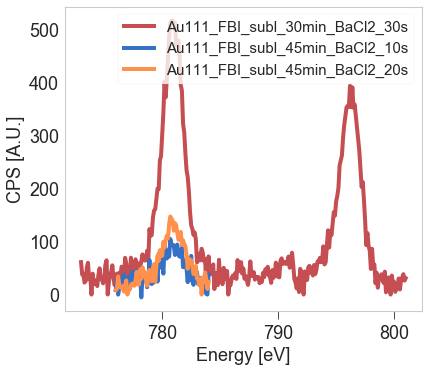

In [76]:
samp2[2].color = 'r'
for xp in [samp2[2], samp3[1], samp3[2]]:
    plot_region(xp, 'Ba_3d')
plt.gca().invert_xaxis()

## Coverages
From https://www.sciencedirect.com/topics/chemistry/barium-chloride
The possible BaCl$_2$ cell types and sizes are:

- Fe2P type: a = 4.059 Å, b = c = 7.083 Å, α = 120°, β = γ = 90°, cell volume = 176.31 Å$^3$

- PbCl2 type, SG = mP24: a = 4.604 Å, b = 8.613 Å, c = 11.901 Å, α = 92.6°, β = γ = 90°, cell volume = 471.48 Å$^3$

So an estimate thickness of each BaCl$_2$ ML is the minimum cell size: 5 Å = 0.5 nm, in case we need it at some point for density estimation.

In [139]:
# Coverage with FBI: IMFP = 1.86 nm
inds = [[1, 0]]
layers_fbi = arrange_coverages(samp2, inds,
                               r_ml = 1.1*nm, region='Au_4f', mfp = 3.87*nm, takeoff = 10)

# Coverage with BaCl2: IMFP = 1.35 nm
# Take previous stage (only FBI) as reference
inds = [[2, 3, 1]]
layers_ba = arrange_coverages(samp2, inds,
                               r_ml = 1*nm, region='Au_4f', mfp = 2.55*nm, takeoff = 10)

In [140]:
layers_fbi, layers_ba

(matrix([[0.60916191, 0.00356714]]), matrix([[0.13400882, 0.00082474],
         [0.57564402, 0.00369642]]))

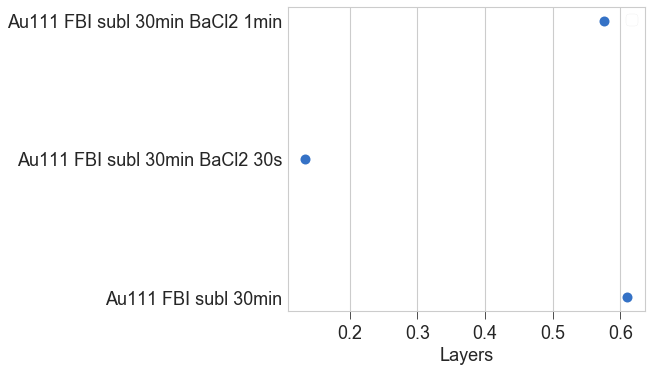

In [141]:
plot_coverages(samp2)

## Fits

Modify user pars


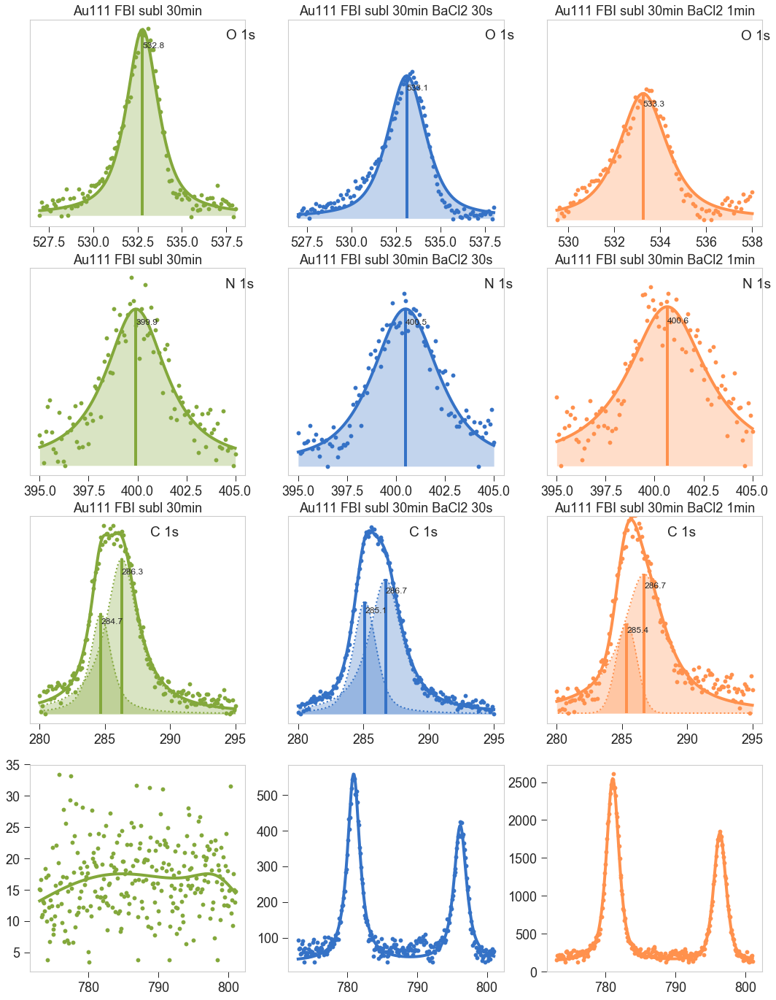

In [37]:
fig, ax = plt.subplots(4, 3, sharex=False, figsize=(18, 24), )

r = 'O_1s'
for i, xp in enumerate(samp2[1:]):
    Fn = XPFit(xp, region = r)
#     Fn.preset_pars('v1_sigma', 0.92)
#     Fn.double_voigt(sepPt=531.5)
    Fn.voigt()
    Fn.set_areas()
    plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[0][i], offset=0,
                    flag_fill=True, plot_comps=True)
    ax[0][i].set(title=xp.name.replace('_', ' '), xlabel='', ylabel='', yticks=[], 
                 ylim=(ax[0][i].get_ylim()[0], ax[0][0].get_ylim()[1]))
    ax[0][i].invert_xaxis()
    ax[0][i].tick_params('both', length=8, width=1, which='major')
    ax[0][i].text(s='O 1s', x=537.5, y=ax[0][0].get_ylim()[1]*0.9, fontsize=19)

r = 'N_1s'
for i, xp in enumerate(samp2[1:]):
    Fn = XPFit(xp, region = r)
#     Fn.preset_pars('v1_sigma', 0.92)
#     Fn.double_voigt(sepPt=400)
    Fn.voigt()
    Fn.set_areas()
    plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[1][i], offset=0,
                    flag_fill=True, plot_comps=True)
    ax[1][i].set(title=xp.name.replace('_', ' '), xlabel='', ylabel='', yticks=[], 
                 ylim=(ax[1][i].get_ylim()[0], ax[1][0].get_ylim()[1]))
    ax[1][i].invert_xaxis()
    ax[1][i].tick_params('both', length=8, width=1, which='major')
    ax[1][i].text(s='N 1s', x=404.5, y=ax[1][0].get_ylim()[1]*0.9, fontsize=19)

r = 'C_1s'
for i, xp in enumerate(samp2[1:]):
    Fn = XPFit(xp, region = r)
    if i == 2: Fn.preset_pars('v1_sigma', 0.9362)
    Fn.double_voigt(sepPt=286)
#     Fn.voigt()
    Fn.set_areas()
    plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[2][i], offset=0,
                    flag_fill=True, plot_comps=True)
    ax[2][i].set(title=xp.name.replace('_', ' '), xlabel='', ylabel='', yticks=[], 
                 ylim=(ax[2][i].get_ylim()[0], ax[2][0].get_ylim()[1]))
    ax[2][i].invert_xaxis()
    ax[2][i].tick_params('both', length=8, width=1, which='major')
    ax[2][i].text(s='C 1s', x=288.5, y=ax[2][0].get_ylim()[1]*0.9, fontsize=19)

r = 'Ba_3d'
# li, _ = plot_fit_result(samp2[3], r, fitRes=samp2[3].fit[r], ax=ax[3][1], flag_fill=True, plot_comps=False)
# lim = li.get_ylim()
# ax[3][1].cla()
for i,xp in enumerate(samp2[1:]):
    Fn = XPFit(xp, region = r)
    Fn.double_voigt()

    li = plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[3][i], flag_fill=True, plot_comps=False)
#     ax[3][i].set(xlabel='', ylabel='', yticks=[], ylim=lim)
    ax[3][i].invert_xaxis()
    ax[3][i].tick_params('both', length=8, width=1, which='major',)
#     ax[3][i].text(s='Ba 3d', x=800, y=lim[1]*0.9, fontsize=19)
# plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
# ax[2][0].legend(list(li.get_lines()), labels = [xp.name for xp in samp2[:0:-1]], ncol=len(selection),
#             loc="upper left", bbox_to_anchor=(0.1, 1.2))  

In [36]:
samp2[1].fit['C_1s'].best_values['v1_sigma'], samp2[1].fit['C_1s'].best_values['v2_sigma']

(0.936204408494256, 1.4813014873949069)

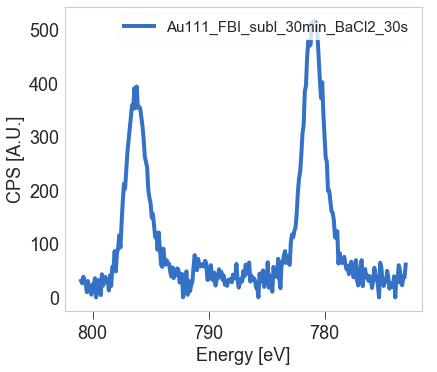

In [140]:
plot_region(samp2[2], 'Ba_3d')

In [76]:
for xp in samp2[1:]:
    print(xp.fit['O_1s'].best_values['v1_sigma'])

0.97172
0.97172


In [103]:
area_big = []
for xp in samp2[1:]:
    area_big.append(xp.area['O_1s_v1_'])
    print(xp.area['O_1s_v1_'])
# area_big.append(selection[4].area['O_1s_v1_'])

0.23360391743226427
0.2405710427494555


Text(537, 371.01033957613885, 'O 1s')

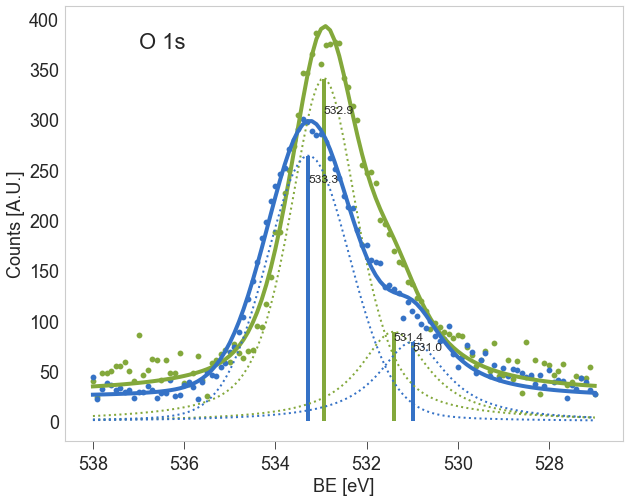

In [146]:
region = 'O_1s'
plt.figure(figsize=(10, 8))
plot_fit_result(samp2[1], region)
plot_fit_result(samp2[2], region)
plt.gca().invert_xaxis()
plt.gca().set(xlabel='BE [eV]', ylabel='Counts [A.U.]')
plt.gca().text(s='O 1s', x=537, y=plt.gca().get_ylim()[1] * 0.9, fontsize=22)

Text(404, 105.90827295241263, 'N 1s')

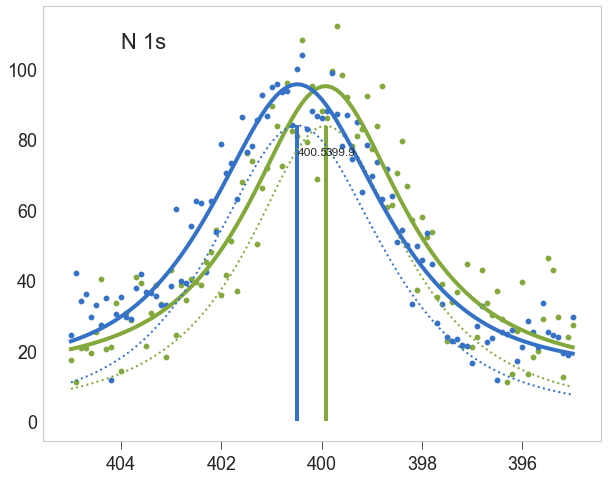

In [403]:
region = 'N_1s'
plt.figure(figsize=(10, 8))
plot_fit_result(samp2[1], region)
plot_fit_result(samp2[2], region)
plt.gca().invert_xaxis()
plt.gca().text(s='N 1s', x=404, y=plt.gca().get_ylim()[1] * 0.9, fontsize=22)

### Plot O_v1 vs subl Ba

Text(0, 0.5, 'Area O*-Ba / Total O 1s area')

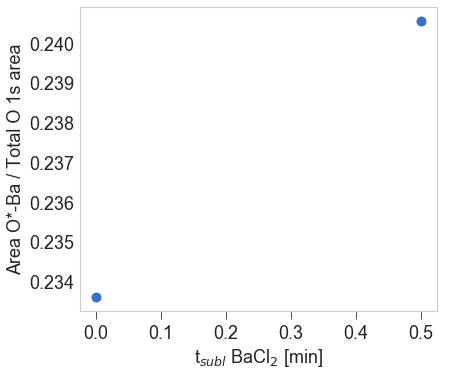

In [108]:
tsubl = [0, 0.5]
plt.plot(tsubl, area_big, 'o', markersize=10)
plt.xlabel('t$_{subl}$ BaCl$_2$ [min]')
plt.ylabel('Area O*-Ba / Total O 1s area')

In [81]:
for xp in samp2:
    write_processed_xp(xp.path, xp)

Storing of file /Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/proc/20210510_Au111_FBI_subl_30min.uxy.ft successful
Storing of file /Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/proc/20210510_Au111_FBI_subl_30min_BaCl2_30s.uxy.ft successful


### Other fits

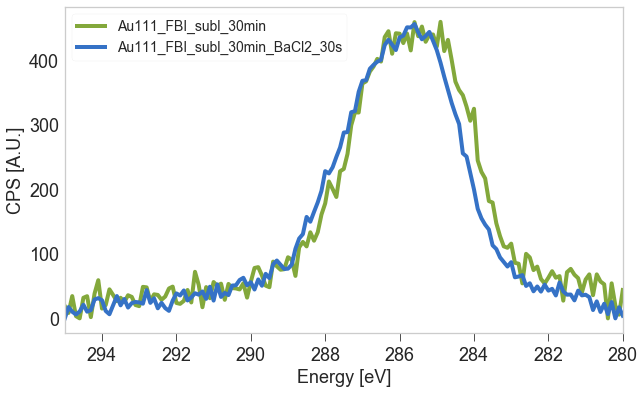

In [29]:
region = 'C_1s'
plt.figure(figsize=(10, 6))
plot_region(samp2[1], region)
plot_region(samp2[2], region)
plt.gca().set(xlim=(295, 280))
plt.legend(loc='upper left', fontsize = 14)

(-0.7000000000000455, (284.9, 285.6))

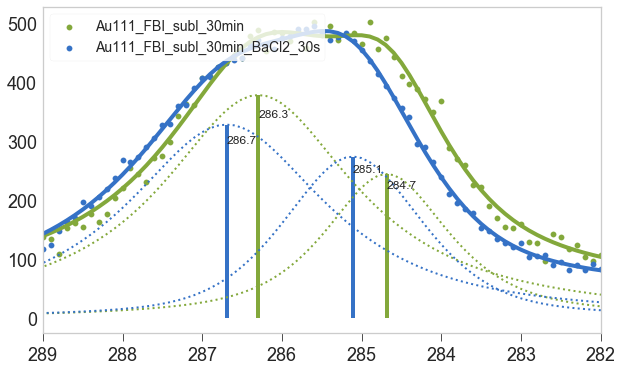

In [35]:
region = 'C_1s'
plt.figure(figsize=(10, 6))
for xp in samp2[1:3]:
    xf0 = XPFit(xp, region)
    xf0.double_voigt(286)
    plot_fit_result(xp, region)
plt.gca().set(xlim=(289, 282))
plt.legend(loc='upper left', fontsize = 14)
get_shift_ymax(samp2[1], samp2[2], 'C_1s')

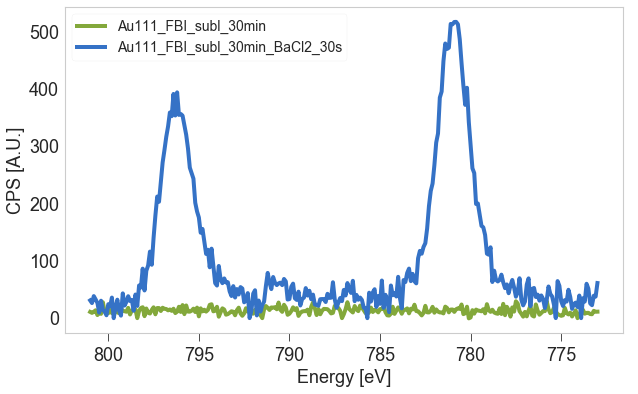

In [304]:
region = 'Ba_3d'
plt.figure(figsize=(10, 6))
plot_region(samp2[1], region)
plot_region(samp2[2], region)
plt.gca().invert_xaxis()
plt.legend(loc='upper left', fontsize = 14)

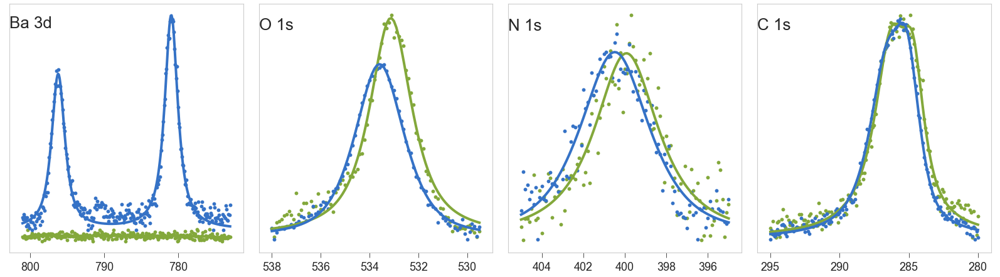

In [459]:
regions = ['Ba_3d', 'O_1s', 'N_1s', 'C_1s']
fig, ax = plt.subplots(1, 4, figsize=(22, 6))
for i, region in enumerate(regions):
    plot_fit_result(samp2[1], region, ax=ax[i], plot_comps=False)
    plot_fit_result(samp2[2], region, ax=ax[i], plot_comps=False)
#     plot_fit_result(samp2[3], region, ax=ax[i])
    
    ax[i].invert_xaxis()
    ax[i].text(s=region.replace('_',' '), x=ax[i].get_xlim()[0], y = ax[i].get_ylim()[1]*0.9, fontsize=26)
    ax[i].set(yticks=[])
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)

# plt.legend(loc='upper left')

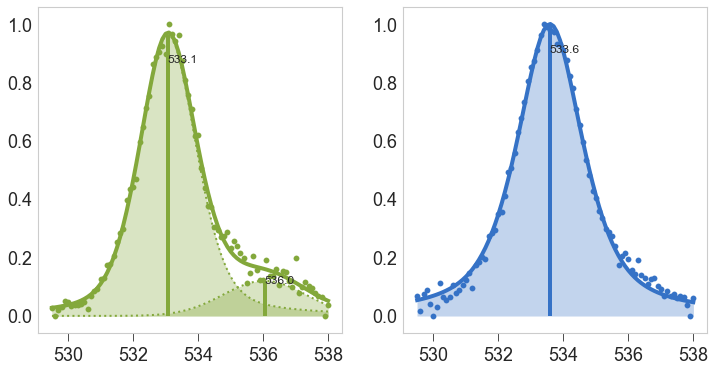

In [103]:
xpnorm = [normalise_dfx(xp) for xp in samp2[1:3]]
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

for i, xp in enumerate(xpnorm):
    Fn = XPFit(xp, region = 'O_1s')
    if i == 0: 
        Fn.double_voigt(sepPt=532)
    else:    Fn.voigt()
    plot_fit_result(xp, 'O_1s', fitRes=xp.fit['O_1s'], ax=ax[i], offset=0,
                    flag_fill=True, plot_comps=True)

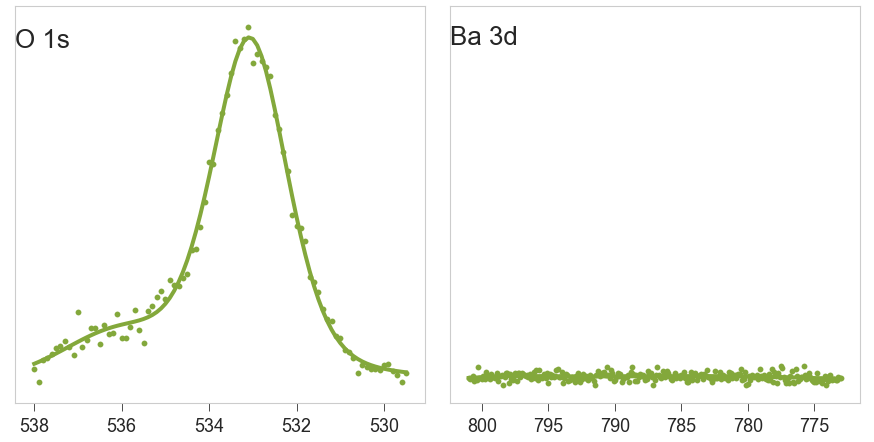

In [104]:
regions = ['O_1s', 'Ba_3d']
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

region = 'O_1s'
plot_fit_result(xpnorm[0], region, ax=ax[0], plot_comps=False)
# plot_fit_result(xpnorm[1], region, ax=ax[0], plot_comps=False)

#     plot_fit_result(samp2[3], region, ax=ax[i])

region = 'Ba_3d'
plot_fit_result(samp2[1], region, ax=ax[1], plot_comps=False)
# plot_fit_result(samp2[2], region, ax=ax[1], plot_comps=False)
# limba = ax[1].get_ylim()
ax[1].set(ylim=limba)
for i, region in enumerate(regions):    
    ax[i].invert_xaxis()
    ax[i].text(s=region.replace('_',' '), x=ax[i].get_xlim()[0], y = ax[i].get_ylim()[1]*0.9, fontsize=26)
    ax[i].set(yticks=[])
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)

# plt.legend(loc='upper left')

# Sample 3 from May 21st, FBI-Prog BaCl2

In [7]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/**/*.uxy'

files = glob.glob(path, recursive=True)
files.sort()
# files[2], files[3] = files[3], files[2]
files

['/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210520_Au111_clean.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210521_Au111_FBI_subl_45min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210521_Au111_FBI_subl_45min_BaCl2_10s.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210522_Au111_FBI_subl_45min_BaCl2_20s.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210523_Au111_FBI_subl_45min_BaCl2_30s.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210523_Au111_FBI_subl_45min_BaCl2_40s.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210524_Au111_FBI_subl_45min_BaCl2_60s.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210524_Au111_FBI_subl_45min_BaCl2_80s.uxy']

In [8]:
samp3 = [read_processed_xp(f) for f in files]
cols = ['k','g', 'b', 'y', 'm', 'c', 'r', 'k']
for xp, c in zip(samp3, cols):
    xp.color = c

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210520_Au111_clean.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210521_Au111_FBI_subl_45min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210521_Au111_FBI_subl_45min_BaCl2_10s.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210522_Au111_FBI_subl_45min_BaCl2_20s.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210523_Au111_FBI_subl_45min_BaCl2_30s.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210523_Au

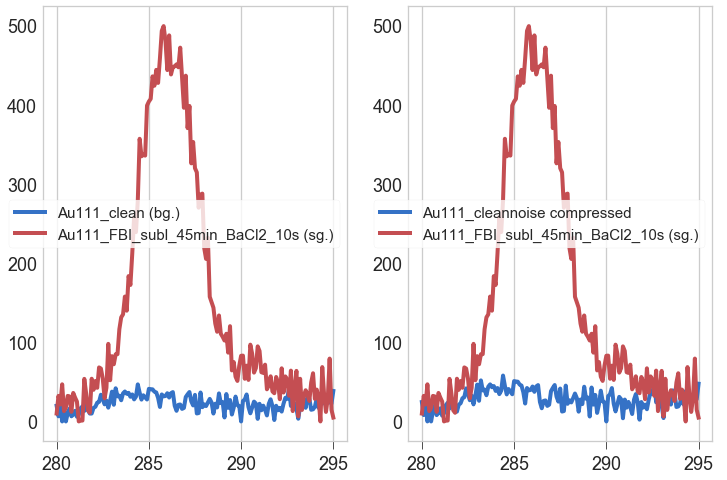

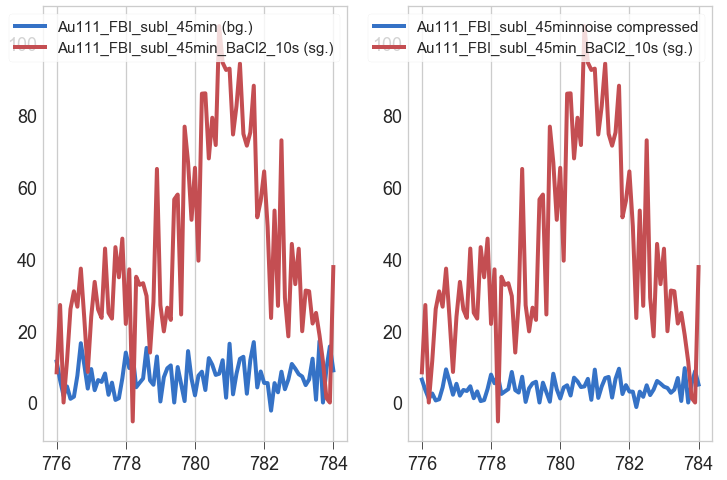

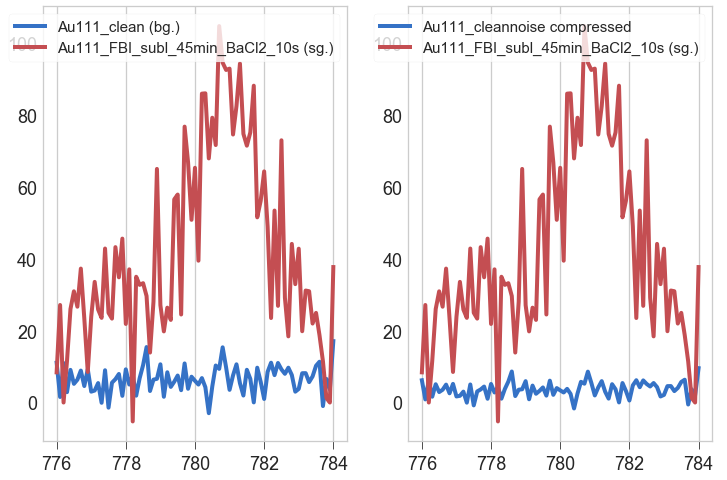

In [9]:
compress_noisy_region(samp3[0], samp3[2], 'C_1s', inplace=True);
compress_noisy_region(samp3[1], samp3[2], 'Ba_3d', inplace=True);
compress_noisy_region(samp3[0], samp3[2], 'Ba_3d', inplace=True);

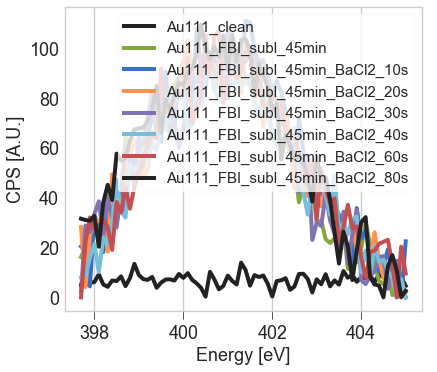

In [10]:
for xp in samp3:
    xpc = crop_spectrum(xp, 'N_1s', edw=397.7, inplace=True)
    plot_region(xpc, 'N_1s')

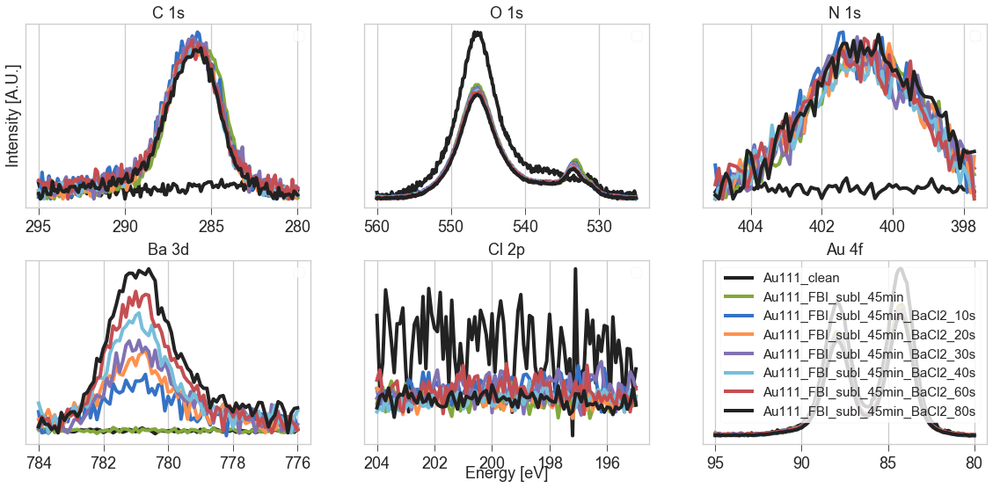

In [11]:
regs = ['C_1s', 'O_1s', 'N_1s', 'Ba_3d', 'Cl_2p', 'Au_4f']

plot_xp_regions(samp3, regs, ncols=3);
# plt.gcf().savefig('/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_26_Cu/Unscaled_exps.png', dpi=200)

## QuickNDirty O 1s bg subtraction (crop)

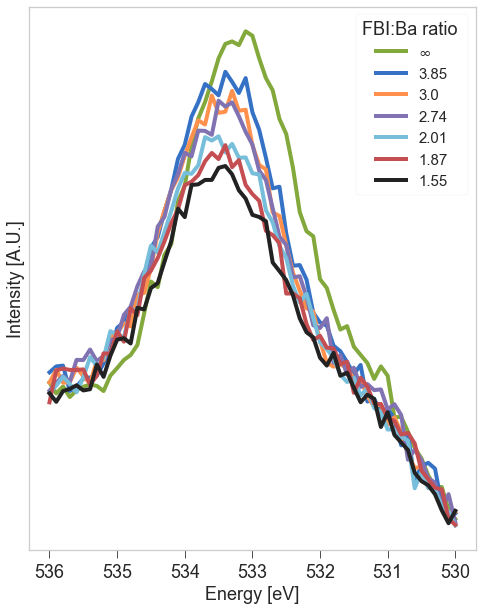

In [18]:
fig = plt.figure(figsize=(8, 10))
fbibaratio = ['$\\infty$', 3.85, 3.00, 2.74, 2.01, 1.87, 1.55]
for i,xp in enumerate(samp3[1:]):
    xpc = crop_spectrum(xp, 'O_1s', edw=530, eup=536, inplace=True)
    plot_region(xpc, 'O_1s', offset=0.7*i, lb=str(fbibaratio[i]))
    ax = plt.gca()
    ax.legend(loc='upper right')
    ax.get_legend().set(title='FBI:Ba ratio ')
    ax.set(yticks=[], ylabel='Intensity [A.U.]')
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/fig2_xps_chelation/fig2_xps_chelation.2).png')

In [19]:
def get_shift_ymax(xp: XPS_experiment, xp0: XPS_experiment, region):
    """Returns 2-tuple with the local maxima and the energy shift between them"""
    idxmax = np.argmax(xp.dfx[region].dropna().counts.values)
    locmax = xp.dfx[region].energy.iloc[idxmax]

    idxmax0 = np.argmax(xp0.dfx[region].dropna().counts.values)
    locmax0 = xp0.dfx[region].energy.iloc[idxmax0]
    return locmax - locmax0, (locmax, locmax0)

In [28]:
get_shift_ymax(samp3[1], samp3[-1], 'O_1s')

(-0.2999999999999545, (533.1, 533.4))

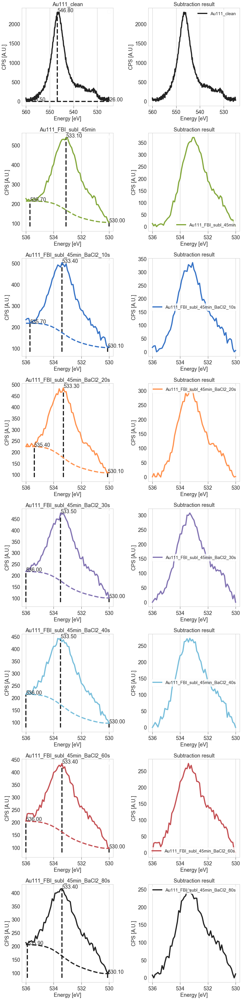

In [35]:
samp3 = region_bg_subtract(samp3, 'O_1s')

## Proper reference subtraction from Au clean (not done yet)

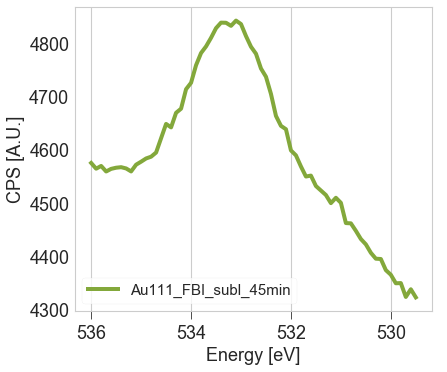

In [174]:
plot_region(raw3[1], 'O_1s')

(<matplotlib.axes._subplots.AxesSubplot at 0x1a2d263278>, 172.6990496696439)

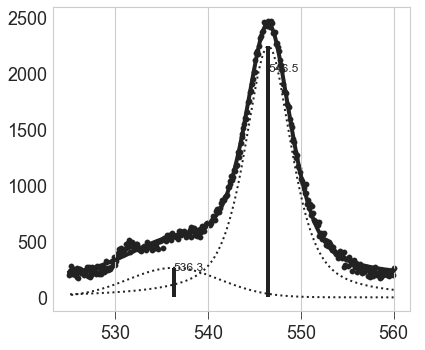

In [162]:
Fn = XPFit(samp3[0], 'O_1s')
Fn.double_voigt()
plot_fit_result(samp3[0], 'O_1s')

In [168]:
samp3[0].fit[region]

(<matplotlib.axes._subplots.AxesSubplot at 0x1a2a77a4e0>, 116.35241620335577)

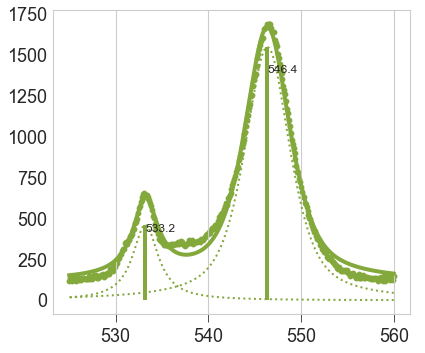

In [175]:
Fn = XPFit(samp3[1], 'O_1s')
fitvg = Fn.double_voigt(sepPt=540)
parg = [1000, 536.3, 5.8]
boundsg = [(900, 4e3), (536, 536.5), (1.5, 6)]
# Fn.gauss_shoulder(fitvg, parg, boundsg)
plot_fit_result(samp3[1], 'O_1s')

## Raw data plot 

In [18]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/*.xy'

files = glob.glob(path, recursive=True)
files.sort()
# files[2], files[3] = files[3], files[2]
files

['/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210520_Au111_clean.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210521_Au111_FBI_subl_45min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210521_Au111_FBI_subl_45min_BaCl2_10s.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210522_Au111_FBI_subl_45min_BaCl2_20s.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210523_Au111_FBI_subl_45min_BaCl2_30s.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210523_Au111_FBI_subl_45min_BaCl2_40s.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210524_Au111_FBI_subl_45min_BaCl2_60s.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210524_Au111_FBI_subl_45min_BaCl2_80s.xy']

In [19]:
raw3 = [xps_data_import(f) for f in files]
cols = ['k','g', 'b', 'y', 'm', 'c', 'r', 'k']
for xp, c in zip(raw3, cols):
    xp.color = c

In [13]:
crop_spectrum(raw2[1], region, eup=536, edw=529, inplace=True)
crop_spectrum(raw2[2], region, eup=536, edw=529, inplace=True);

NameError: name 'raw2' is not defined

In [14]:
crop_spectrum(raw3[1], region, eup=536, edw=529.5, inplace=True)
crop_spectrum(raw3[4], region, eup=536, edw=529.5, inplace=True);

NameError: name 'region' is not defined

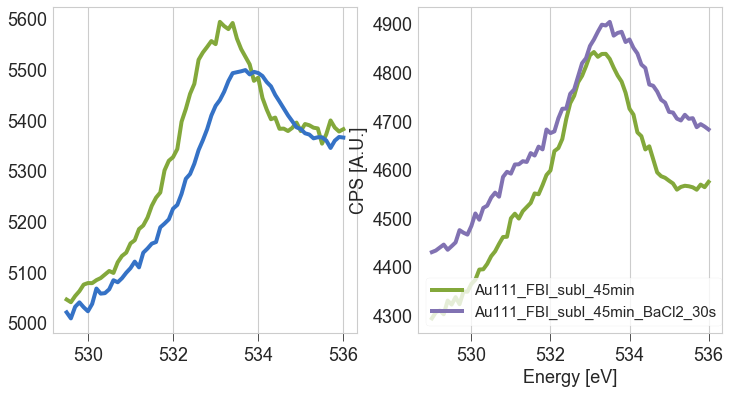

In [112]:
region = 'O_1s'
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
plot_region(raw2[1], region=region, ax=ax[0])
plot_region(raw2[2], region=region, ax=ax[0])
plot_region(raw3[1], region=region, ax=ax[1])
plot_region(raw3[4], region=region, ax=ax[1], offset=400)

In [129]:
raw2[1].color = 'lime'

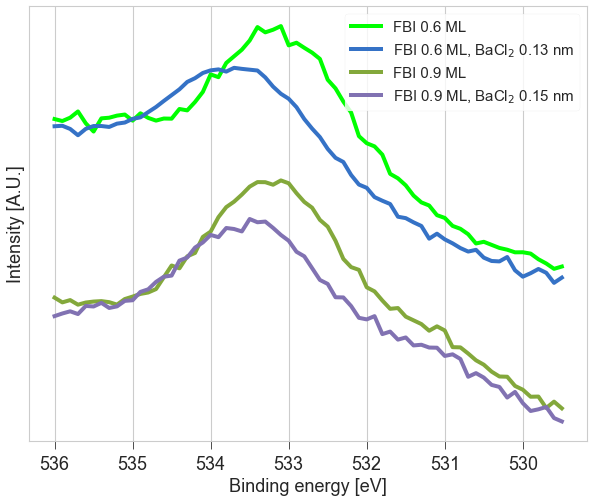

In [144]:
plt.figure(figsize=(10, 8))
region = 'O_1s'

plot_region(raw2[1], region=region, lb='FBI 0.6 ML')
plot_region(raw2[2], region=region, lb='FBI 0.6 ML, BaCl$_2$ 0.13 nm')
plot_region(raw3[1], region=region, offset=400, lb='FBI 0.9 ML')
plot_region(raw3[4], region=region, offset=400+250, lb='FBI 0.9 ML, BaCl$_2$ 0.15 nm')

ax = plt.gca()
ax.legend(loc='upper right')
# ax.get_legend().set(')
ax.set(yticks=[], xlabel='Binding energy [eV]', ylabel='Intensity [A.U.]')
ax.invert_xaxis()
plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/fig2_xps_chelation/fig2_xps_chelation.c).png')

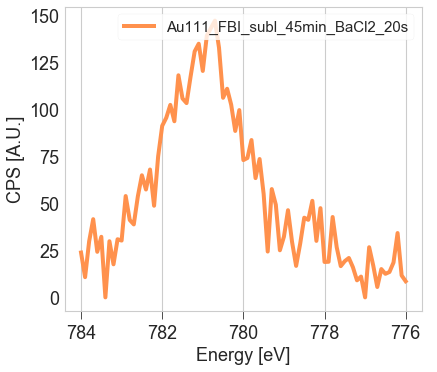

In [21]:
plot_region(samp3[3], 'Ba_3d')

## Stoichiometry

In [55]:
asf

{'C_1s': 0.296,
 'O_1s': 0.711,
 'N_1s': 0.477,
 'Ba_3d': 7.49,
 'Br_3p': 1.054,
 'Cu_2p': 5.321,
 'Ba_4d': 2.35,
 'Na_1s': 1.685,
 'In3d': 4.359,
 'Sn3d': 4.725,
 'Cl_2p': 0.891,
 'Si2p': 0.339}

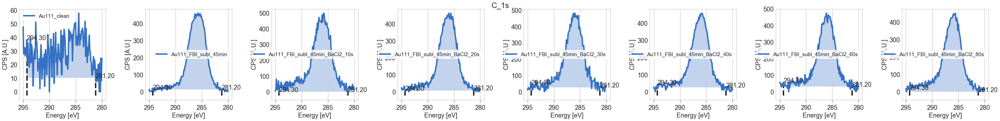

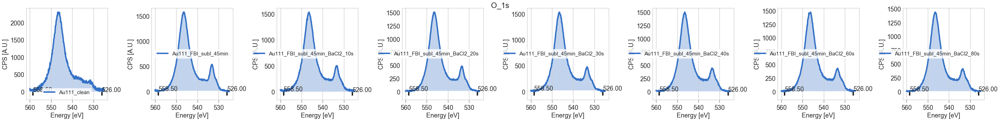

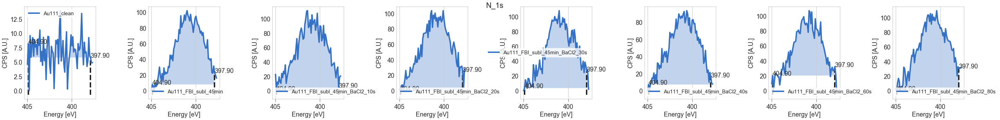

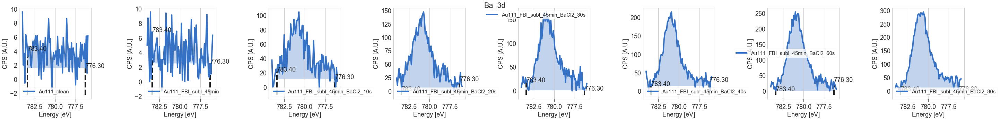

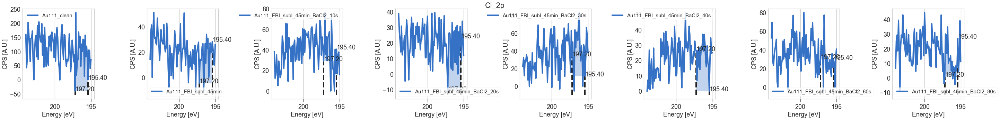

In [33]:
for r in regs[:-1]:
    integrateRegions(samp3, r, asf=asf)

'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area


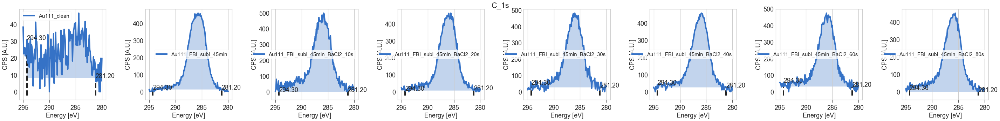

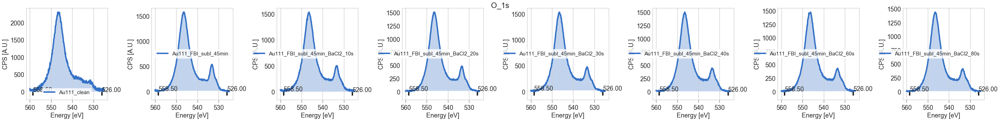

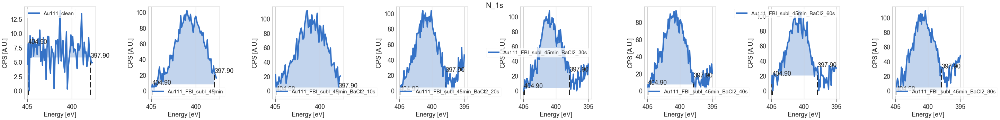

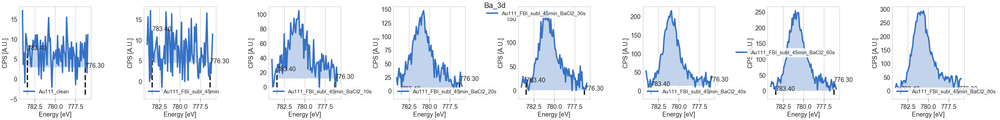

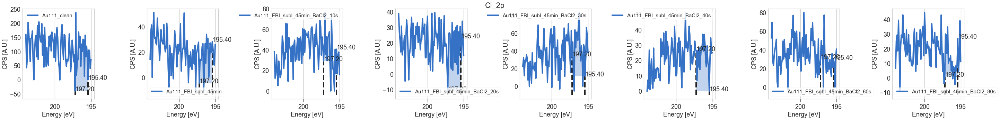

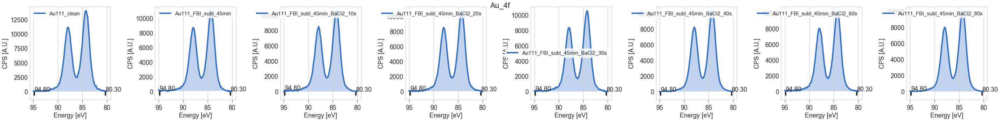

In [13]:
for r in regs:
    integrateRegions(samp3, r, asf=asf2)

### Correct Ba 3d 5/2 (area ratio 5/2 : 3/2 = 3:2) UPDATE: if using ASF[Ba_3d_5/2] it already accounts for the area of both peaks

In [66]:
# for xp in samp3:
#     xp.area['Ba_3d'] *= (1 + 2/3) 

### "FBI" effective stoichiometry

In [63]:
for xp in samp3:
    xp.area['FBI0'] = xp.area['N_1s'] / 3

In [14]:
for xp in samp3:
    xp.area['FBI0'] = xp.area['N_1s'] / 3

### Stoichiometry results

In [64]:
num, denom = (('N_1s', 'C_1s', 'C_1s' ), ('O_1s', 'N_1s', 'O_1s',))
make_stoichometry_table(samp3[1:],  num=num, denom=denom, sep=' \t ')

num, denom = ('Ba_3d', 'N_1s', 'Cl_2p'), ('FBI0', 'Ba_3d', 'Ba_3d')
make_stoichometry_table(samp3[2:],  num=num, denom=denom, sep=' \t ')


Experiment	N_/O_	C_/N_	C_/O_	
Au111_FBI_subl_45min 	 0.63  	  8.28  	  5.18  	  
Au111_FBI_subl_45min_BaCl2_10s 	 0.71  	  8.66  	  6.16  	  
Au111_FBI_subl_45min_BaCl2_20s 	 0.77  	  7.94  	  6.14  	  
Au111_FBI_subl_45min_BaCl2_30s 	 0.71  	  8.70  	  6.18  	  
Au111_FBI_subl_45min_BaCl2_40s 	 0.72  	  8.78  	  6.30  	  
Au111_FBI_subl_45min_BaCl2_60s 	 0.77  	  8.63  	  6.64  	  
Au111_FBI_subl_45min_BaCl2_80s 	 0.90  	  7.40  	  6.65  	  
Experiment	Ba_/FBI	N_/Ba_	Cl_/Ba_	
Au111_FBI_subl_45min_BaCl2_10s 	 0.16  	  19.27  	  1.72  	  
Au111_FBI_subl_45min_BaCl2_20s 	 0.20  	  14.99  	  0.67  	  
Au111_FBI_subl_45min_BaCl2_30s 	 0.22  	  13.70  	  1.42  	  
Au111_FBI_subl_45min_BaCl2_40s 	 0.30  	  10.06  	  0.61  	  
Au111_FBI_subl_45min_BaCl2_60s 	 0.32  	  9.33  	  0.66  	  
Au111_FBI_subl_45min_BaCl2_80s 	 0.39  	  7.76  	  0.22  	  


In [16]:
num, denom = ('Ba_3d', 'N_1s', 'Cl_2p'), ('FBI0', 'Ba_3d', 'Ba_3d')
display_stoichiometry(samp3[2:],  num=num, denom=denom)


In [ ]:
np.sqrt(samp3[2].area['Ba_3d']) / 

In [64]:
num, denom = (('N_1s', 'C_1s', 'C_1s' ), ('O_1s', 'N_1s', 'O_1s',))
make_stoichometry_table(samp3[1:],  num=num, denom=denom, sep=' \t ')

num, denom = ('Ba_3d', 'N_1s', 'Cl_2p'), ('FBI0', 'Ba_3d', 'Ba_3d')
make_stoichometry_table(samp3[2:],  num=num, denom=denom, sep=' \t ')


Experiment	N_/O_	C_/N_	C_/O_	
Au111_FBI_subl_45min 	 0.63  	  8.28  	  5.18  	  
Au111_FBI_subl_45min_BaCl2_10s 	 0.71  	  8.66  	  6.16  	  
Au111_FBI_subl_45min_BaCl2_20s 	 0.77  	  7.94  	  6.14  	  
Au111_FBI_subl_45min_BaCl2_30s 	 0.71  	  8.70  	  6.18  	  
Au111_FBI_subl_45min_BaCl2_40s 	 0.72  	  8.78  	  6.30  	  
Au111_FBI_subl_45min_BaCl2_60s 	 0.77  	  8.63  	  6.64  	  
Au111_FBI_subl_45min_BaCl2_80s 	 0.90  	  7.40  	  6.65  	  
Experiment	Ba_/FBI	N_/Ba_	Cl_/Ba_	
Au111_FBI_subl_45min_BaCl2_10s 	 0.16  	  19.27  	  1.72  	  
Au111_FBI_subl_45min_BaCl2_20s 	 0.20  	  14.99  	  0.67  	  
Au111_FBI_subl_45min_BaCl2_30s 	 0.22  	  13.70  	  1.42  	  
Au111_FBI_subl_45min_BaCl2_40s 	 0.30  	  10.06  	  0.61  	  
Au111_FBI_subl_45min_BaCl2_60s 	 0.32  	  9.33  	  0.66  	  
Au111_FBI_subl_45min_BaCl2_80s 	 0.39  	  7.76  	  0.22  	  


In [65]:
num, denom = (('N_1s', 'C_1s', 'C_1s', 'N_1s', 'Cl_2p' ), ('O_1s', 'N_1s', 'O_1s','Ba_3d', 'Ba_3d'))
make_stoichometry_table(samp3[:-1],  num=num, denom=denom, sep=' \t ')


Experiment	N_/O_	C_/N_	C_/O_	N_/Ba_	Cl_/Ba_	
Au111_clean 	 0.00  	  12.99  	  0.05  	  29.71  	  59.47  	  
Au111_FBI_subl_45min 	 0.63  	  8.28  	  5.18  	  212.46  	  8.89  	  
Au111_FBI_subl_45min_BaCl2_10s 	 0.71  	  8.66  	  6.16  	  19.27  	  1.72  	  
Au111_FBI_subl_45min_BaCl2_20s 	 0.77  	  7.94  	  6.14  	  14.99  	  0.67  	  
Au111_FBI_subl_45min_BaCl2_30s 	 0.71  	  8.70  	  6.18  	  13.70  	  1.42  	  
Au111_FBI_subl_45min_BaCl2_40s 	 0.72  	  8.78  	  6.30  	  10.06  	  0.61  	  
Au111_FBI_subl_45min_BaCl2_60s 	 0.77  	  8.63  	  6.64  	  9.33  	  0.66  	  


### Stoichiometry results ASF 2

In [57]:
num, denom = (('N_1s', 'C_1s', 'C_1s' ), ('O_1s', 'N_1s', 'O_1s',))
make_stoichometry_table(samp3[1:],  num=num, denom=denom, sep=' \t ')

num, denom = ('Ba_3d', 'N_1s', 'Cl_2p'), ('FBI0', 'Ba_3d', 'Ba_3d')
make_stoichometry_table(samp3[2:],  num=num, denom=denom, sep=' \t ')


Experiment	N_/O_	C_/N_	C_/O_	
Au111_FBI_subl_45min 	 0.68  	  9.25  	  6.32  	  
Au111_FBI_subl_45min_BaCl2_10s 	 0.78  	  9.67  	  7.51  	  
Au111_FBI_subl_45min_BaCl2_20s 	 0.84  	  8.87  	  7.48  	  
Au111_FBI_subl_45min_BaCl2_30s 	 0.78  	  9.72  	  7.54  	  
Au111_FBI_subl_45min_BaCl2_40s 	 0.78  	  9.81  	  7.68  	  
Au111_FBI_subl_45min_BaCl2_60s 	 0.84  	  9.64  	  8.10  	  
Au111_FBI_subl_45min_BaCl2_80s 	 0.98  	  8.26  	  8.11  	  
Experiment	Ba_/FBI	N_/Ba_	Cl_/Ba_	
Au111_FBI_subl_45min_BaCl2_10s 	 0.17  	  17.62  	  2.32  	  
Au111_FBI_subl_45min_BaCl2_20s 	 0.22  	  13.70  	  0.90  	  
Au111_FBI_subl_45min_BaCl2_30s 	 0.24  	  12.52  	  1.91  	  
Au111_FBI_subl_45min_BaCl2_40s 	 0.33  	  9.20  	  0.82  	  
Au111_FBI_subl_45min_BaCl2_60s 	 0.35  	  8.53  	  0.88  	  
Au111_FBI_subl_45min_BaCl2_80s 	 0.42  	  7.10  	  0.30  	  


In [17]:
display_stoichiometry(samp3[2:], num=num, denom=denom)

In [24]:
eba = np.sqrt(samp3[2].area['Ba_3d'] * asf2['Ba_3d']) / ( samp3[2].area['Ba_3d'] * asf2['Ba_3d'])

In [22]:
en = np.sqrt(samp3[2].area['N_1s'] * asf2['N_1s']) / ( samp3[2].area['N_1s'] * asf2['N_1s'])
en

0.049664015880529926

In [25]:
np.sqrt(en**2 + eba**2)

0.07412224279585546

In [58]:
num, denom = (('N_1s', 'C_1s', 'C_1s', 'N_1s', 'Cl_2p' ), ('O_1s', 'N_1s', 'O_1s','Ba_3d', 'Ba_3d'))
make_stoichometry_table(samp3[:-1],  num=num, denom=denom, sep=' \t ')


Experiment	N_/O_	C_/N_	C_/O_	N_/Ba_	Cl_/Ba_	
Au111_clean 	 0.00  	  14.50  	  0.06  	  27.16  	  80.18  	  
Au111_FBI_subl_45min 	 0.68  	  9.25  	  6.32  	  194.24  	  11.99  	  
Au111_FBI_subl_45min_BaCl2_10s 	 0.78  	  9.67  	  7.51  	  17.62  	  2.32  	  
Au111_FBI_subl_45min_BaCl2_20s 	 0.84  	  8.87  	  7.48  	  13.70  	  0.90  	  
Au111_FBI_subl_45min_BaCl2_30s 	 0.78  	  9.72  	  7.54  	  12.52  	  1.91  	  
Au111_FBI_subl_45min_BaCl2_40s 	 0.78  	  9.81  	  7.68  	  9.20  	  0.82  	  
Au111_FBI_subl_45min_BaCl2_60s 	 0.84  	  9.64  	  8.10  	  8.53  	  0.88  	  


## Coverages
From https://www.sciencedirect.com/topics/chemistry/barium-chloride
The possible BaCl$_2$ cell types and sizes are:

- Fe2P type: a = 4.059 Å, b = c = 7.083 Å, α = 120°, β = γ = 90°, cell volume = 176.31 Å$^3$

- PbCl2 type, SG = mP24: a = 4.604 Å, b = 8.613 Å, c = 11.901 Å, α = 92.6°, β = γ = 90°, cell volume = 471.48 Å$^3$

So an estimate thickness of each BaCl$_2$ ML is the minimum cell size: 5 Å = 0.5 nm, in case we need it at some point for density estimation.

In [26]:
# Coverage with FBI: IMFP = 1.86 nm
inds = [[1, 0]]
layers_fbi = arrange_coverages(samp3, inds,
                               r_ml = 1.1*nm, region='Au_4f', mfp = 3.87*nm, takeoff = 10)

# Coverage with BaCl2: IMFP = 1.35 nm
# Take previous stage (only FBI) as reference
inds = [[2, 3, 4, 5, 6, 7, 1]]
layers_ba = arrange_coverages(samp3, inds,
                               r_ml = 1*nm, region='Au_4f', mfp = 2.55*nm, takeoff = 10)

In [24]:
samp3[0].area.pop('layers')

In [27]:
layers_ba, layers_fbi

(matrix([[0.08696854, 0.00062131],
         [0.11885594, 0.00085139],
         [0.14190606, 0.00101851],
         [0.2112314 , 0.00152529],
         [0.19855796, 0.00143217],
         [0.2976568 , 0.00216632]]), matrix([[0.91627662, 0.00612522]]))

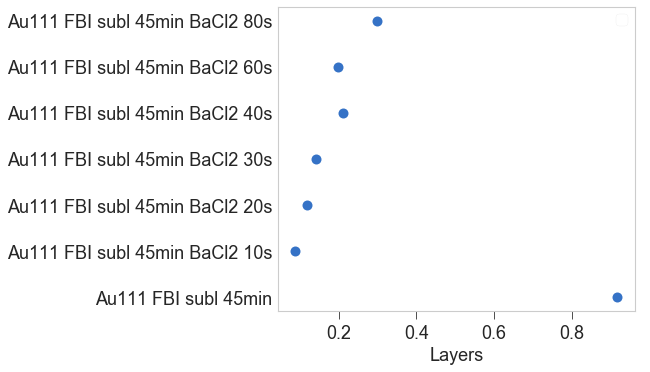

In [28]:
plot_coverages(samp3)

## Fits

Modify user pars


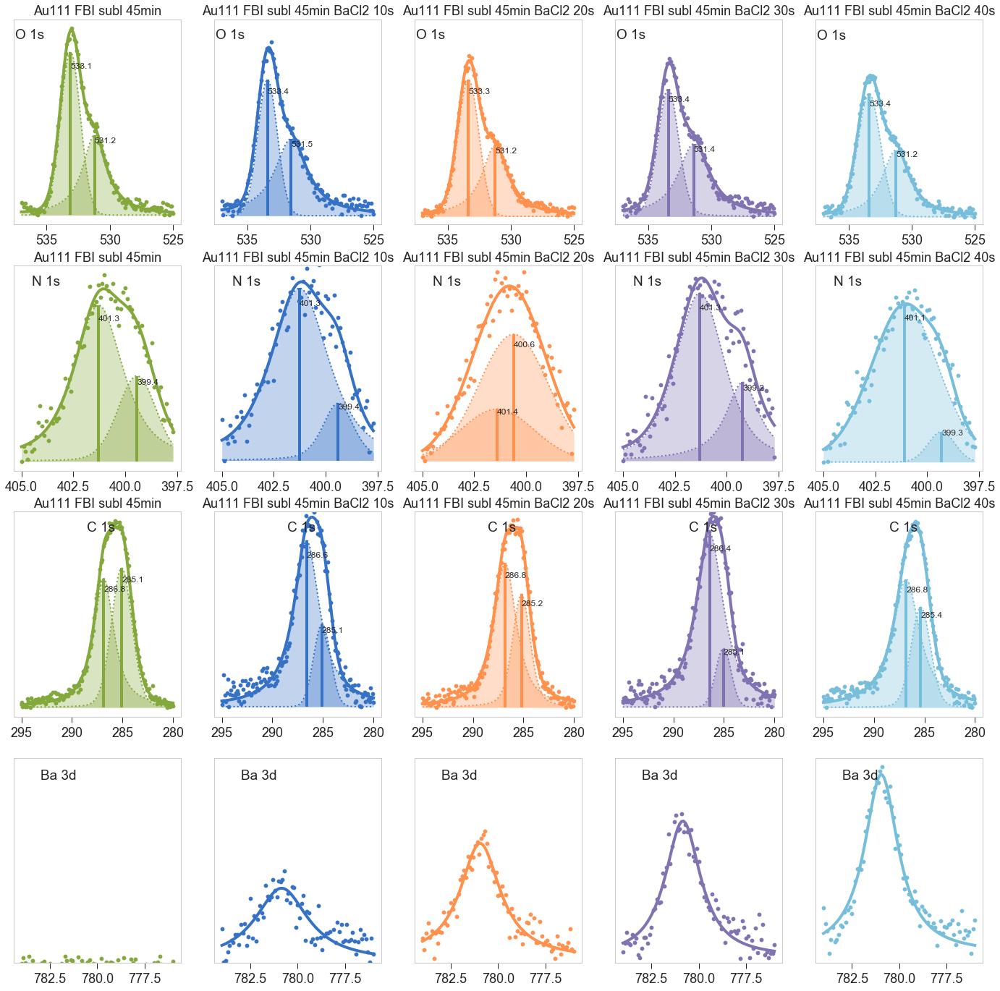

In [127]:
fig, ax = plt.subplots(4, 5, sharex=False, figsize=(24, 24), )

r = 'O_1s'
for i, xp in enumerate(samp3[1:]):
    Fn = XPFit(xp, region = r)
#     Fn.preset_pars('v1_sigma', 0.92)
    Fn.double_voigt(sepPt=531.5)
#     Fn.voigt()
    Fn.set_areas()
    plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[0][i], offset=0,
                    flag_fill=True, plot_comps=True)
    ax[0][i].set(title=xp.name.replace('_', ' '), xlabel='', ylabel='', yticks=[], 
                 ylim=(ax[0][i].get_ylim()[0], ax[0][0].get_ylim()[1]))
    ax[0][i].invert_xaxis()
    ax[0][i].tick_params('both', length=8, width=1, which='major')
    ax[0][i].text(s='O 1s', x=537.5, y=ax[0][0].get_ylim()[1]*0.9, fontsize=19)

r = 'N_1s'
for i, xp in enumerate(samp3[1:]):
    Fn = XPFit(xp, region = r)
#     Fn.preset_pars('v1_sigma', 0.92)
    Fn.double_voigt(sepPt=400)
#     Fn.voigt()
    Fn.set_areas()
    plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[1][i], offset=0,
                    flag_fill=True, plot_comps=True)
    ax[1][i].set(title=xp.name.replace('_', ' '), xlabel='', ylabel='', yticks=[], 
                 ylim=(ax[1][i].get_ylim()[0], ax[1][0].get_ylim()[1]))
    ax[1][i].invert_xaxis()
    ax[1][i].tick_params('both', length=8, width=1, which='major')
    ax[1][i].text(s='N 1s', x=404.5, y=ax[1][0].get_ylim()[1]*0.9, fontsize=19)

r = 'C_1s'
for i, xp in enumerate(samp3[1:]):
    Fn = XPFit(xp, region = r)
    if i == 2: Fn.preset_pars('v1_sigma', 1.033460)
    Fn.double_voigt(sepPt=286)
#     Fn.voigt()
    Fn.set_areas()
    plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[2][i], offset=0,
                    flag_fill=True, plot_comps=True)
    ax[2][i].set(title=xp.name.replace('_', ' '), xlabel='', ylabel='', yticks=[], 
                 ylim=(ax[2][i].get_ylim()[0], ax[2][0].get_ylim()[1]))
    ax[2][i].invert_xaxis()
    ax[2][i].tick_params('both', length=8, width=1, which='major')
    ax[2][i].text(s='C 1s', x=288.5, y=ax[2][0].get_ylim()[1]*0.9, fontsize=19)

r = 'Ba_3d'
li, _ = plot_fit_result(samp3[5], r, fitRes=samp3[5].fit[r], ax=ax[3][1], flag_fill=True, plot_comps=False)
lim = li.get_ylim()
ax[3][1].cla()
for i,xp in enumerate(samp3[1:]):
    Fn = XPFit(xp, region = r)
    Fn.voigt()
    Fn.set_areas()
    li = plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[3][i], flag_fill=True, plot_comps=False)
    ax[3][i].set(xlabel='', ylabel='', yticks=[], ylim=lim)
    ax[3][i].invert_xaxis()
    ax[3][i].tick_params('both', length=8, width=1, which='major',)
    ax[3][i].text(s='Ba 3d', x=783, y=lim[1]*0.9, fontsize=19)
# plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
# ax[2][0].legend(list(li.get_lines()), labels = [xp.name for xp in samp3[:01:]], ncol=len(selection),
#             loc="upper left", bbox_to_anchor=(0.1, 1.2))  

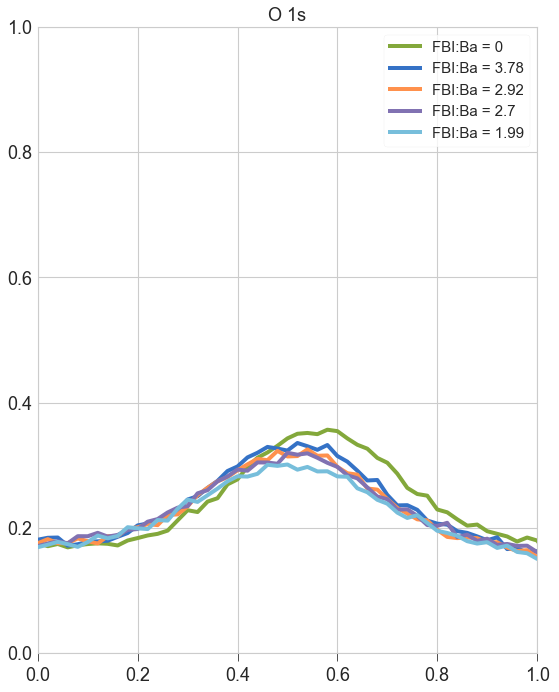

In [157]:
fbibaratio = [0, 3.78, 2.92, 2.70, 1.99]
fig, ax = plt.subplots(1, sharex=False, figsize=(8, 10))
ax.grid(True, axis='both')

axx = fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
axx.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.xlabel("Energy [eV]")
plt.ylabel("Counts [A.U.]")

seps =  532
enmx, comx = [], []
r = 'O_1s'
for i, xp in enumerate(samp3[1:]):
#     Fn = XPFit(xp, region = r)
#     Fn.double_voigt(sepPt=seps)
#     li, off = plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax, flag_fill=True , plot_comps=False,
#                               offset=0)
    plot_region(xp, r)
    ax = plt.gca()
#     argmx = np.argmax(xp.dfx[r].counts)

#     enmx.append(xp.dfx[r].energy.loc[argmx])
#     comx.append(xp.dfx[r].counts.loc[argmx] + off)
ax.plot(enmx, comx, '--k', lw=2.5)
ax.set(title=r.replace('_', ' '), xlim=(536, 531), xlabel='', ylabel='', yticks=[])
# ax.invert_xaxis()

plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)     #  First manage the space and THEN add the legend
handles = list(li.get_lines())
labels = ['FBI:Ba = '+str(cov) for cov in fbibaratio]#[::-1]
ax.legend(handles, labels, ncol=1,)
#            loc="upper left", bbox_to_anchor=(1., 1.))           

# fig.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v3/fbi_coverage_all_norm.png', dpi=200, bbox_inches = 'tight')

In [288]:
samp3[2].fit['C_1s'].best_values['v1_sigma']

1.0334600519416277

In [76]:
for xp in samp3[1:]:
    print(xp.fit['O_1s'].best_values['v1_sigma'])

0.97172
0.97172


In [103]:
area_big = []
for xp in samp3[1:]:
    area_big.append(xp.area['O_1s_v1_'])
    print(xp.area['O_1s_v1_'])
# area_big.append(selection[4].area['O_1s_v1_'])

0.23360391743226427
0.2405710427494555


In [42]:
def get_shift_fit(xp: XPS_experiment, xp0: XPS_experiment, region):
    """Fit to one component and return centers of two components and the energy shift"""
    c1 = xp.fit[region].best_values['v1_center']
    c2 = xp0.fit[region].best_values['v1_center']
    
    return c1 - c2, (c1, c2)

Text(537, 371.01033957613885, 'O 1s')

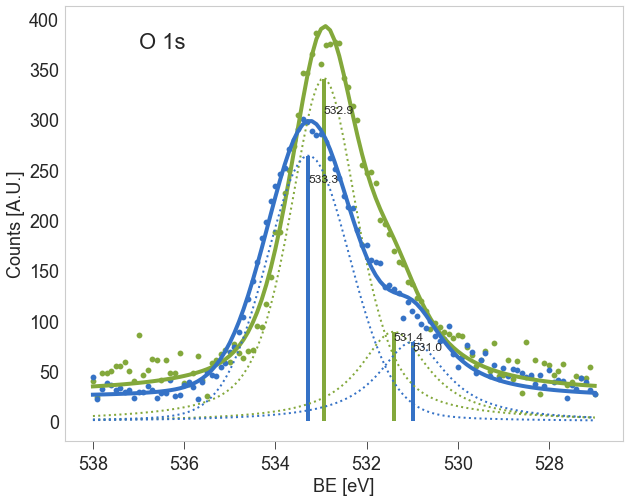

In [146]:
region = 'O_1s'
plt.figure(figsize=(10, 8))
plot_fit_result(samp3[1], region)
plot_fit_result(samp3[2], region)
plt.gca().invert_xaxis()
plt.gca().set(xlabel='BE [eV]', ylabel='Counts [A.U.]')
plt.gca().text(s='O 1s', x=537, y=plt.gca().get_ylim()[1] * 0.9, fontsize=22)

(0.03282309400390204, (400.6968178848533, 400.6639947908494))

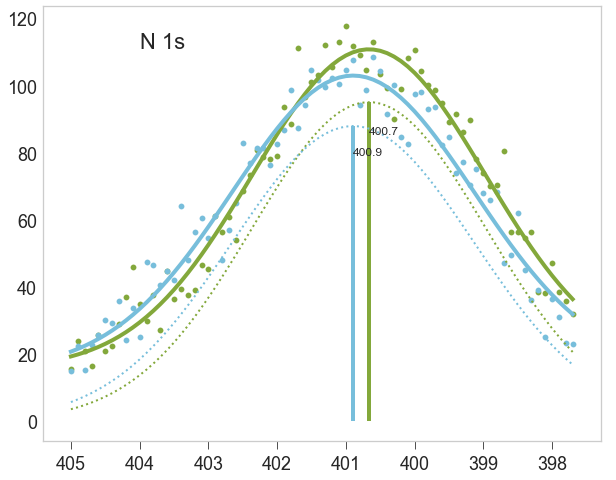

In [45]:
region = 'N_1s'
plt.figure(figsize=(10, 8))
for xp in [samp3[1], samp3[5]]:
    xpf = XPFit(xp, region)
    xpf.voigt()
    plot_fit_result(xp, region)
plt.gca().invert_xaxis()
plt.gca().text(s='N 1s', x=404, y=plt.gca().get_ylim()[1] * 0.9, fontsize=22)
get_shift_ymax(samp3[-1], samp3[1], region)
get_shift_fit(samp3[-1], samp3[1], region)

### Plot O_v1 vs subl Ba

Text(0, 0.5, 'Area O*-Ba / Total O 1s area')

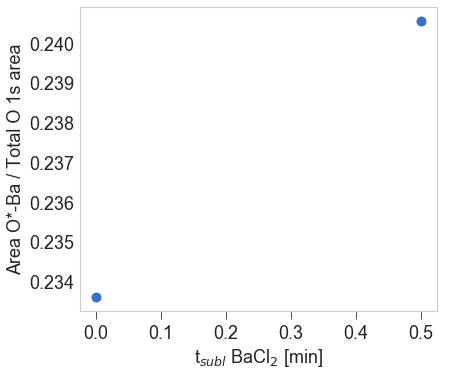

In [108]:
tsubl = [0, 0.5]
plt.plot(tsubl, area_big, 'o', markersize=10)
plt.xlabel('t$_{subl}$ BaCl$_2$ [min]')
plt.ylabel('Area O*-Ba / Total O 1s area')

### Other fits

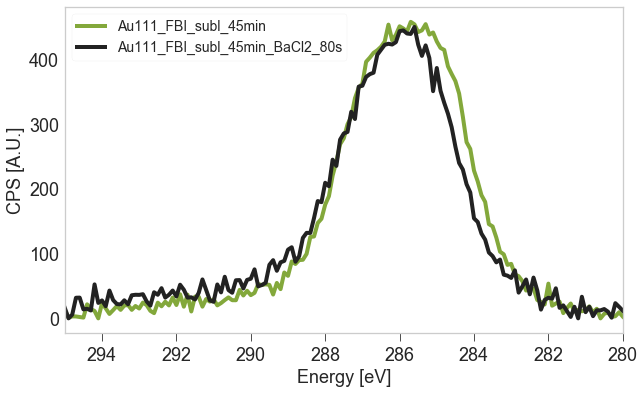

In [37]:
region = 'C_1s'
plt.figure(figsize=(10, 6))
plot_region(samp3[1], region)
plot_region(samp3[-1], region)
plt.gca().set(xlim=(295, 280))
plt.legend(loc='upper left', fontsize = 14)

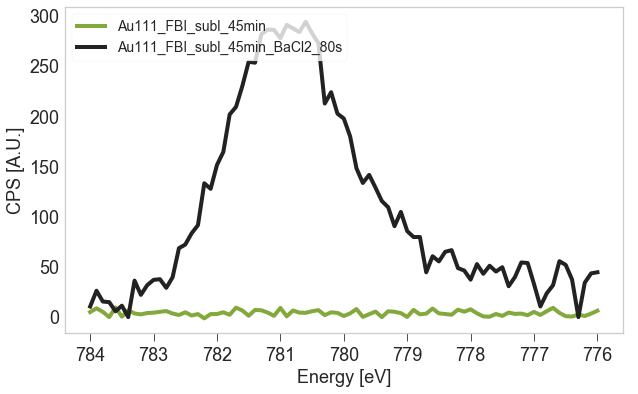

In [38]:
region = 'Ba_3d'
plt.figure(figsize=(10, 6))
plot_region(samp3[1], region)
plot_region(samp3[-1], region)
plt.gca().invert_xaxis()
plt.legend(loc='upper left', fontsize = 14)

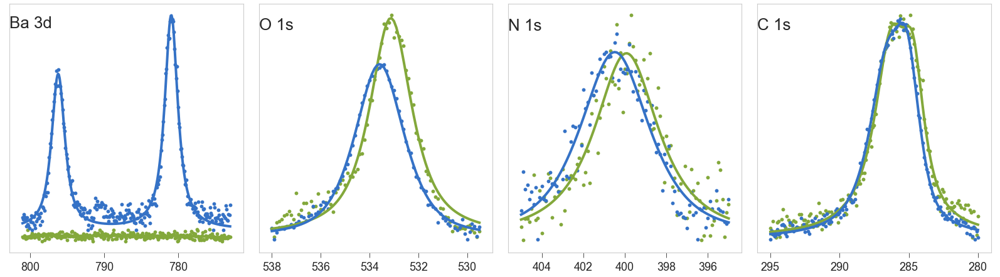

In [459]:
regions = ['Ba_3d', 'O_1s', 'N_1s', 'C_1s']
fig, ax = plt.subplots(1, 4, figsize=(22, 6))
for i, region in enumerate(regions):
    plot_fit_result(samp3[1], region, ax=ax[i], plot_comps=False)
    plot_fit_result(samp3[2], region, ax=ax[i], plot_comps=False)
#     plot_fit_result(samp3[3], region, ax=ax[i])
    
    ax[i].invert_xaxis()
    ax[i].text(s=region.replace('_',' '), x=ax[i].get_xlim()[0], y = ax[i].get_ylim()[1]*0.9, fontsize=26)
    ax[i].set(yticks=[])
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)

# plt.legend(loc='upper left')

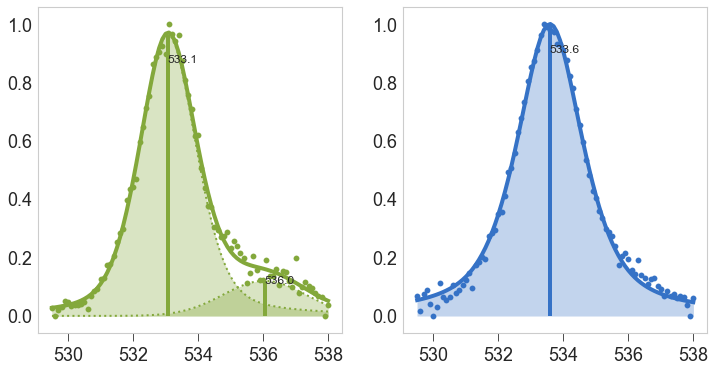

In [210]:
xpnorm = [normalise_dfx(xp) for xp in samp3[1:3]]
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

for i, xp in enumerate(xpnorm):
    Fn = XPFit(xp, region = 'O_1s')
    if i == 0: 
        Fn.double_voigt(sepPt=532)
    else:    Fn.voigt()
    plot_fit_result(xp, 'O_1s', fitRes=xp.fit['O_1s'], ax=ax[i], offset=0,
                    flag_fill=True, plot_comps=True)

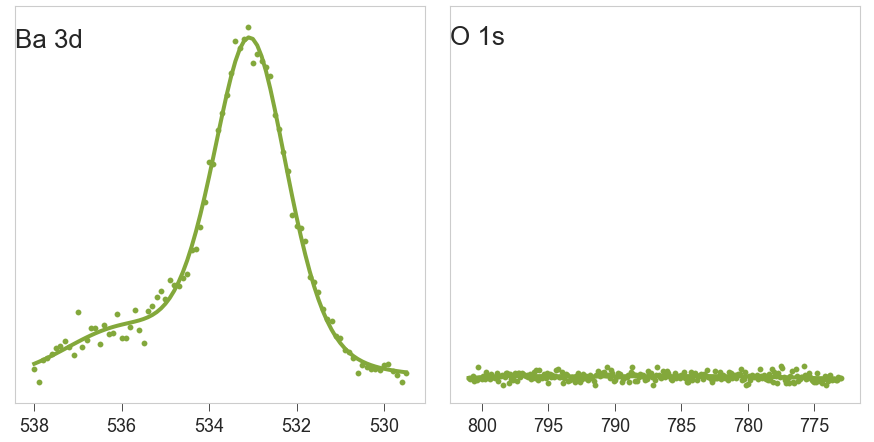

In [213]:
regions = ['Ba_3d', 'O_1s']
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

region = 'O_1s'
plot_fit_result(xpnorm[0], region, ax=ax[0], plot_comps=False)
# plot_fit_result(xpnorm[1], region, ax=ax[0], plot_comps=False)

#     plot_fit_result(samp3[3], region, ax=ax[i])

region = 'Ba_3d'
plot_fit_result(samp3[1], region, ax=ax[1], plot_comps=False)
# plot_fit_result(samp3[2], region, ax=ax[1], plot_comps=False)
# limba = ax[1].get_ylim()
ax[1].set(ylim=limba)
for i, region in enumerate(regions):    
    ax[i].invert_xaxis()
    ax[i].text(s=region.replace('_',' '), x=ax[i].get_xlim()[0], y = ax[i].get_ylim()[1]*0.9, fontsize=26)
    ax[i].set(yticks=[])
plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)

# plt.legend(loc='upper left')

## Save progress

In [36]:
for xp in samp3:
    write_processed_xp(xp.path, xp)

# Sample 4 from May 25th, BaCl2 ONLY

In [12]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_25_Au111/**/*.uxy'

files = glob.glob(path, recursive=True)
files.sort()
files[0], files[2] = files[2], files[0]
files

['/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_25_Au111/proc/20210525_Au111_clean.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_25_Au111/proc/20210525_Au111_BaCl2_subl_80s.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_25_Au111/proc/20210525_Au111_BaCl2_subl_320s.uxy']

In [13]:
samp4 = [read_processed_xp(f) for f in files]
# for xp in samp4:
#     xp.name = xp.name.replace('17-Cu_','').replace('subl_','')

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_25_Au111/proc/20210525_Au111_clean.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_25_Au111/proc/20210525_Au111_BaCl2_subl_80s.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_25_Au111/proc/20210525_Au111_BaCl2_subl_320s.uxy.ft', returning empty fit dict


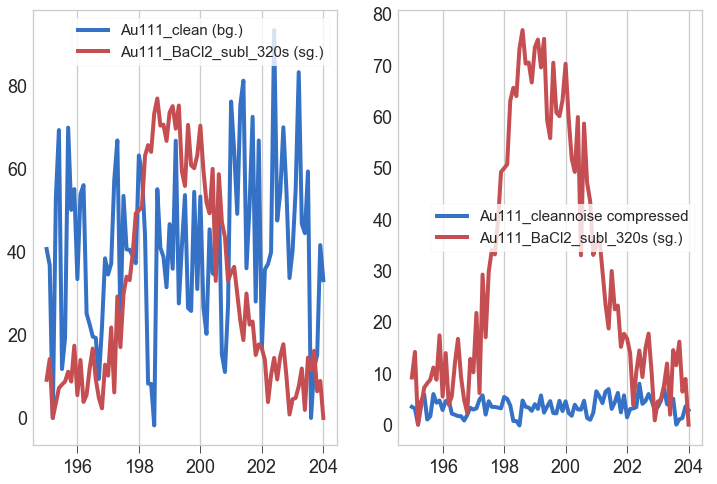

In [14]:
compress_noisy_region(samp4[0], samp4[2], 'Cl_2p', inplace=True);

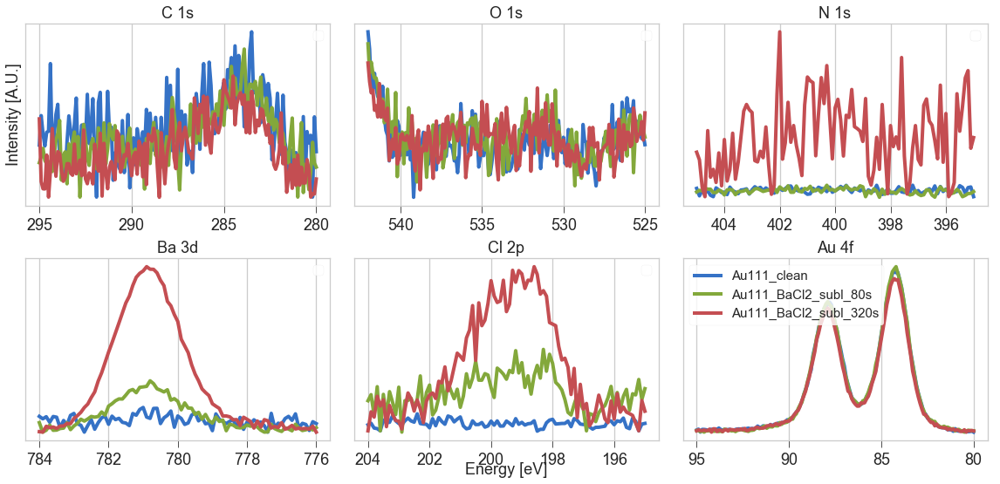

In [15]:
regs = ['C_1s', 'O_1s', 'N_1s', 'Ba_3d', 'Cl_2p', 'Au_4f']

plot_xp_regions(samp4, regs, ncols=3);
# plt.gcf().savefig('/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/Unscaled_exps.png', dpi=200)

## Plot Cl 2p and Ba 3d

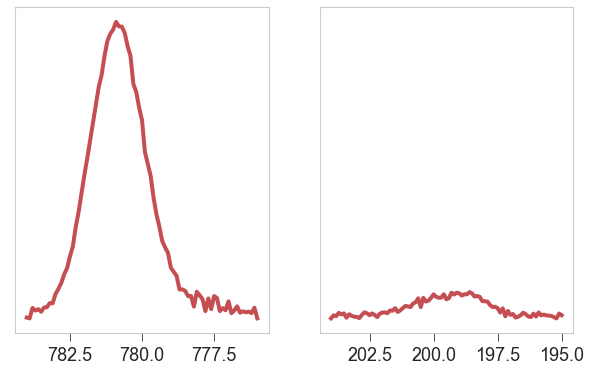

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
samp4[2].color= 'r'
plot_region(samp4[2], 'Cl_2p', ax=ax[1])
plot_region(samp4[2], 'Ba_3d', ax=ax[0])
ax[0].set(yticks=[])
ax[0].invert_xaxis()
ax[1].invert_xaxis()

ax[1].set(yticks=[], xlabel=None, ylabel=None, ylim=ax[0].get_ylim())
ax[1].get_legend().remove()

[[], Text(0, 0.5, ''), Text(0.5, 0, '')]

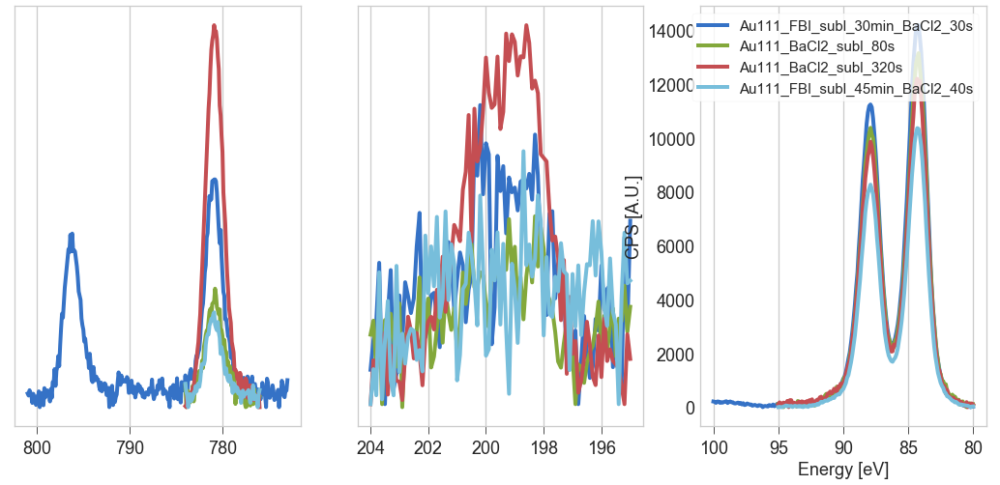

In [49]:
fig, ax = plt.subplots(1, 3, figsize=(18, 8))
samp4[2].color= 'r'
# plot_region(samp4[2], 'Cl_2p', ax=ax[1])
# plot_region(samp4[2], 'Ba_3d', ax=ax[0])
plot_region(samp2[2], 'Cl_2p', ax=ax[1])
plot_region(samp2[2], 'Ba_3d', ax=ax[0])
plot_region(samp2[2], 'Au_4f', ax=ax[2])

plot_region(samp4[1], 'Cl_2p', ax=ax[1])
plot_region(samp4[1], 'Ba_3d', ax=ax[0])
plot_region(samp4[1], 'Au_4f', ax=ax[2])

plot_region(samp4[2], 'Cl_2p', ax=ax[1])
plot_region(samp4[2], 'Ba_3d', ax=ax[0])
plot_region(samp4[2], 'Au_4f', ax=ax[2])

plot_region(samp3[5], 'Cl_2p', ax=ax[1])
plot_region(samp3[5], 'Ba_3d', ax=ax[0])
plot_region(samp3[5], 'Au_4f', ax=ax[2])

ax[0].set(yticks=[])
ax[0].invert_xaxis()
ax[1].invert_xaxis()
ax[2].invert_xaxis()
ax[1].set(yticks=[], xlabel=None, ylabel=None)#, ylim=ax[0].get_ylim())
# ax[1].get_legend().remove()

In [45]:
def export_csv(file: str, xp: XPS_experiment):
    """Export to Igor compatible csv format"""
    with open(file, 'w') as fout:
        regions = [xp.dfx.columns[r][0] for r in range(len(xp.dfx.columns))]
        header = ''.join('%s_BE\t%s_cps\t' %(r, r) for r in regions[::2])
        fout.write(header+'\n')
        xp.dfx.to_csv(fout, sep='\t', na_rep='NaN', index=None, header=False)

In [50]:
path = '/Users/pabloherrero/sabat/xps_spectra/ALOISA/BaCl2/'

export_csv(path+samp2[1].name+'.csv', xp)

In [15]:
ax[1].get_xlim()

(204.45, 194.55)

## Stoichiometry

'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area


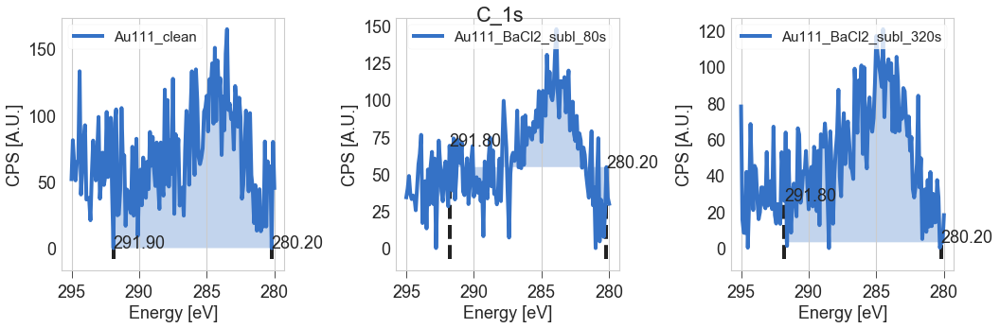

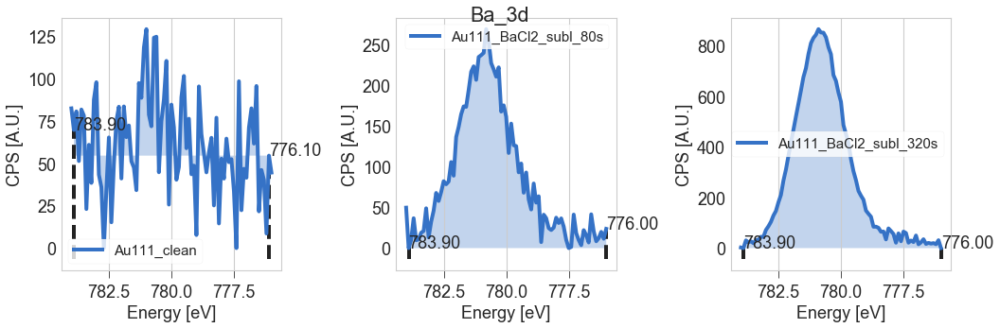

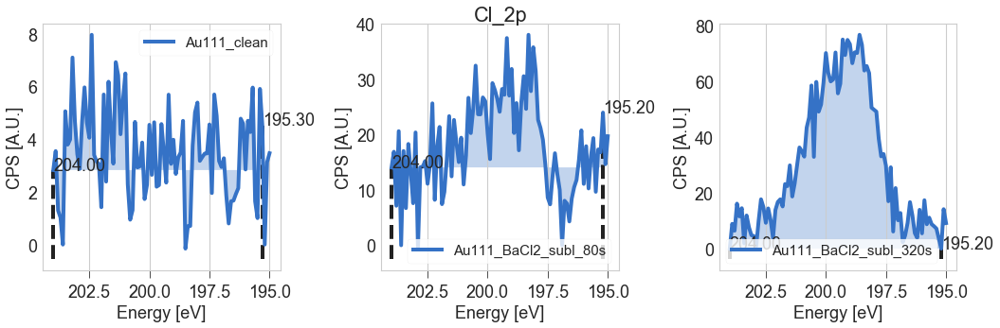

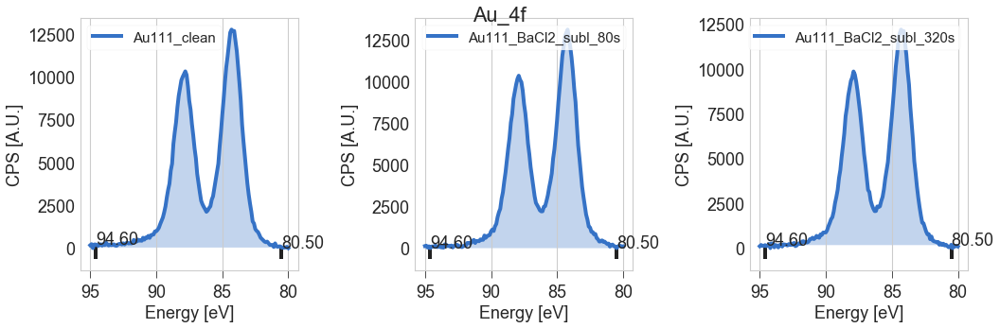

In [128]:
regs = ['C_1s', 'Ba_3d', 'Cl_2p', 'Au_4f']

for r in regs:
    integrateRegions(samp4, r, asf=asf)

'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area


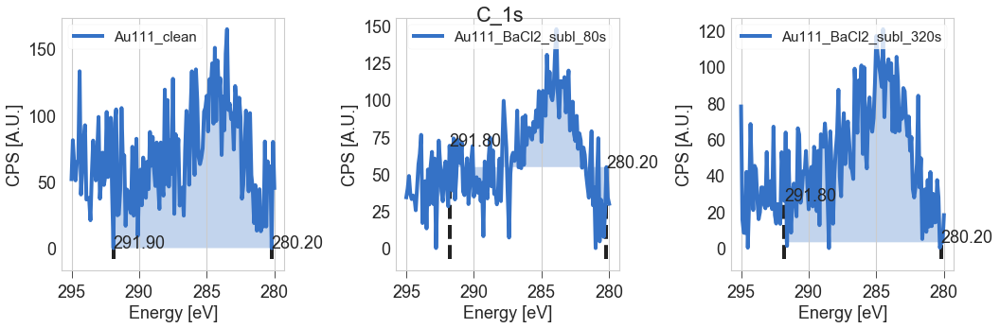

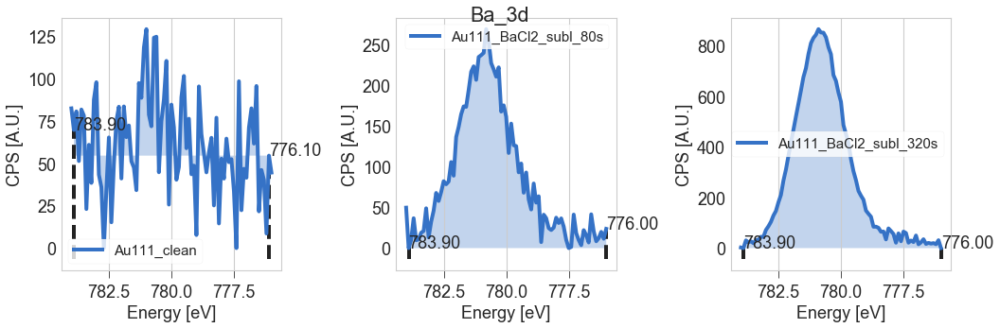

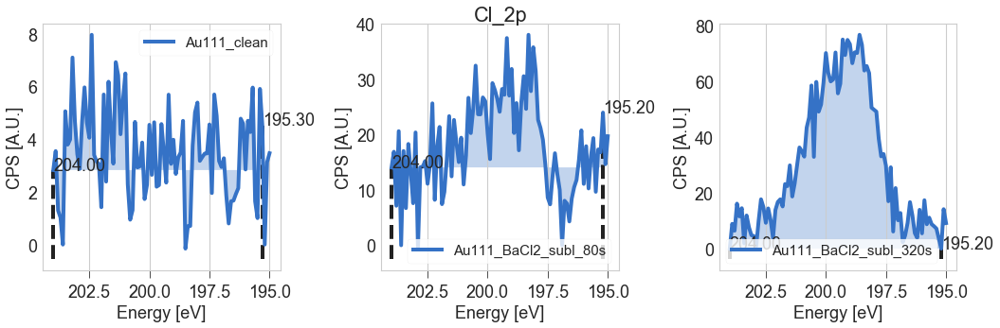

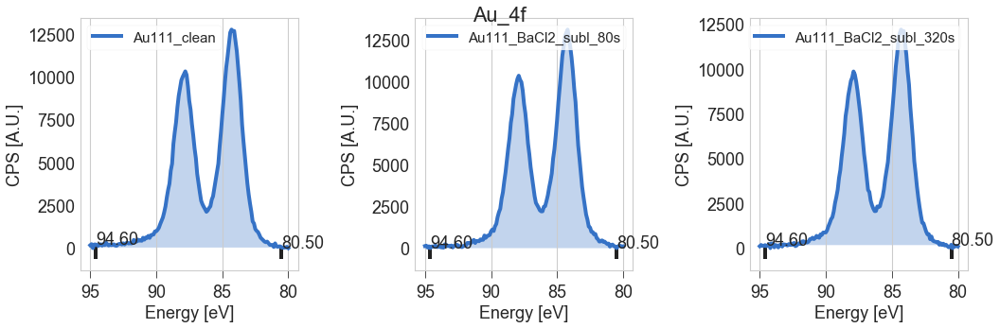

In [126]:
regs = ['C_1s', 'Ba_3d', 'Cl_2p', 'Au_4f']

for r in regs:
    integrateRegions(samp4, r, asf=asf2)

### Correct Ba 3d 5/2 (area ratio 5/2 : 3/2 = 3:2)

In [17]:
# for xp in samp4:
#     xp.area['Ba_3d'] *= (1 + 2/3) 

In [129]:
num, denom = ('C_1s', 'Cl_2p'), ( 'Ba_3d', 'Ba_3d')
make_stoichometry_table(samp4[1:],  num=num, denom=denom, sep=' \t ')


Experiment	C_/Ba_	Cl_/Ba_	
Au111_BaCl2_subl_80s 	 28.23  	  1.95  	  
Au111_BaCl2_subl_320s 	 7.53  	  1.06  	  


### ASF 2

In [127]:
num, denom = ('C_1s', 'Cl_2p'), ( 'Ba_3d', 'Ba_3d')
make_stoichometry_table(samp4[1:],  num=num, denom=denom, sep=' \t ')


Experiment	C_/Ba_	Cl_/Ba_	
Au111_BaCl2_subl_80s 	 28.83  	  2.63  	  
Au111_BaCl2_subl_320s 	 7.69  	  1.43  	  


## Coverages

In [42]:
# Coverage with FBI: IMFP = 1.86 nm

# Coverage with BaCl2: IMFP = 1.35 nm
inds = [[1,0], [2, 0]]
layers_ba = arrange_coverages(samp4, inds,
                               r_ml = 0.5*nm, region='Au_4f', mfp = 2.55*nm, takeoff = 10)
layers_ba

matrix([[9.74395652e-03, 6.34001995e-05],
        [2.95067466e-01, 1.94510939e-03]])

In [41]:
samp4[2].area['layers']

0.16173398572846576

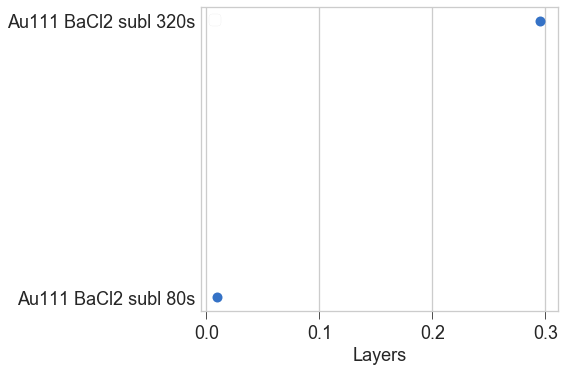

In [43]:
plot_coverages(samp4)

# Sample 1 from May 4th, NaCl

In [82]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/**/*.uxy'

files = glob.glob(path, recursive=True)
files.sort()
files[0], files[1] = files[1], files[0]
files

['/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/proc/20210507_Au111_clean.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/proc/20210507_Au111_FBI_subl_30min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/proc/20210508_Au111_FBI_subl_30min_NaCl_2min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/proc/20210508_Au111_FBI_subl_30min_NaCl_2min_150ºC.uxy']

In [83]:
samp1 = [read_processed_xp(f) for f in files]
# for xp in samp1:
#     xp.name = xp.name.replace('17-Cu_','').replace('subl_','')

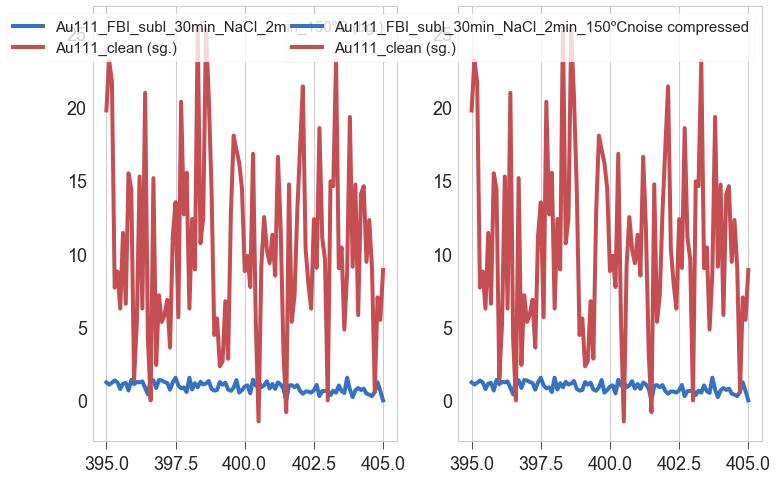

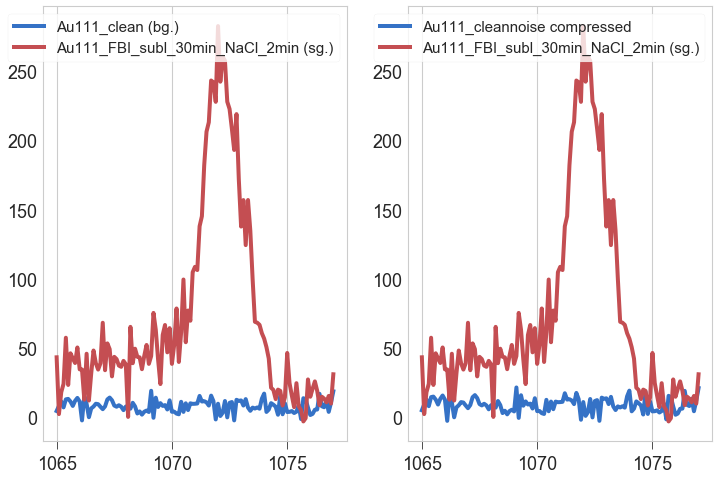

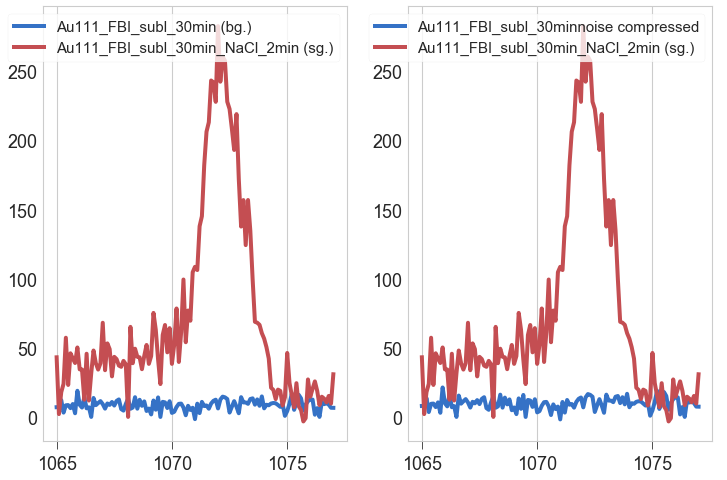

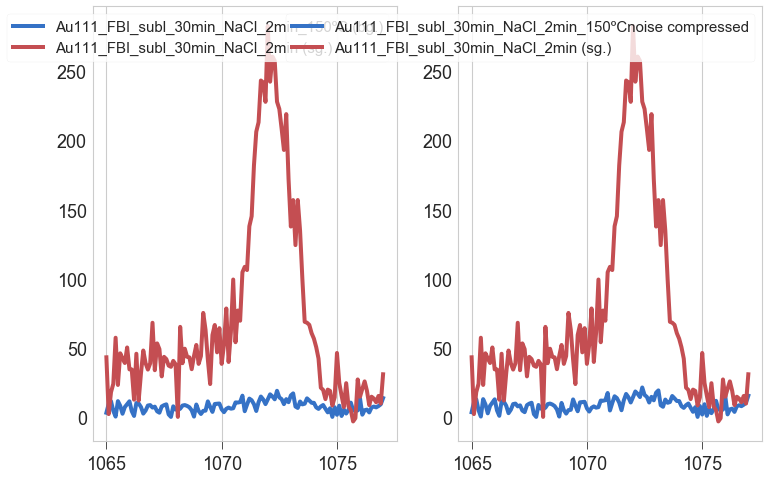

In [84]:
compress_noisy_region(samp1[3], samp1[0], 'N_1s', inplace=True);
compress_noisy_region(samp1[0], samp1[2], 'Na_1s', inplace=True);
compress_noisy_region(samp1[1], samp1[2], 'Na_1s', inplace=True);
compress_noisy_region(samp1[3], samp1[2], 'Na_1s', inplace=True);

crop_spectrum(samp1[0], 'O_1s', eup=537, edw=530, inplace=True)
for xp in samp1[1:]:
    trim_spectra(xp, samp1[0], 'O_1s', inplace=True)

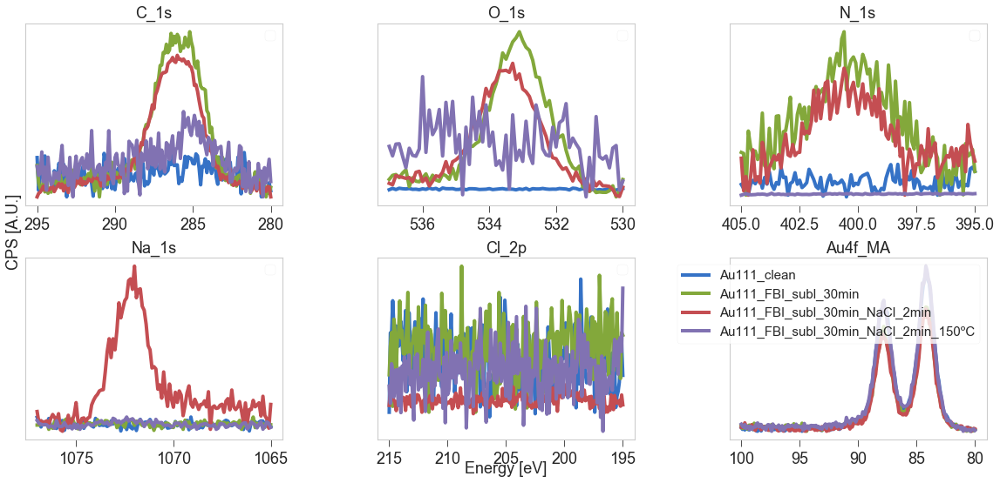

In [422]:
regs = ['C_1s', 'O_1s', 'N_1s', 'Na_1s', 'Cl_2p', 'Au4f_MA']

plot_xp_regions(samp1, regs, ncols=3);
# plt.gcf().savefig('/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/Unscaled_exps.png', dpi=200)

In [22]:
for r in regs[:3]:
    enmx = []
    comx = []
    for xp in samp1:
        argmx = np.argmax(xp.dfx[r].counts)
        enmx.append(xp.dfx[r].energy.loc[argmx])
        comx.append(xp.dfx[r].counts.loc[argmx])
    print(r, enmx[0] - enmx[1])

C_1s 0.30000000000001137
O_1s 0.5
N_1s 0.5999999999999659


## Raw data plot

In [147]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/*.xy'

files = glob.glob(path, recursive=True)
files.sort()
files[0], files[1] = files[1], files[0]
files

['/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/20210507_Au111_clean.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/20210507_Au111_FBI_subl_30min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/20210508_Au111_FBI_subl_30min_NaCl_2min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/20210508_Au111_FBI_subl_30min_NaCl_2min_150ºC.xy']

In [151]:
raw1 = [xps_data_import(f) for f in files]
raw1[2].color = 'y'
# for xp in samp1:
#     xp.name = xp.name.replace('17-Cu_','').replace('subl_','')

## Stoichiometry

'Ba_3d' region does not exist in Au111_FBI_subl_30min_NaCl_2min_150ºC
'Au_4f' region does not exist in Au111_clean
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area
'Au_4f' , asf missing, returning raw area


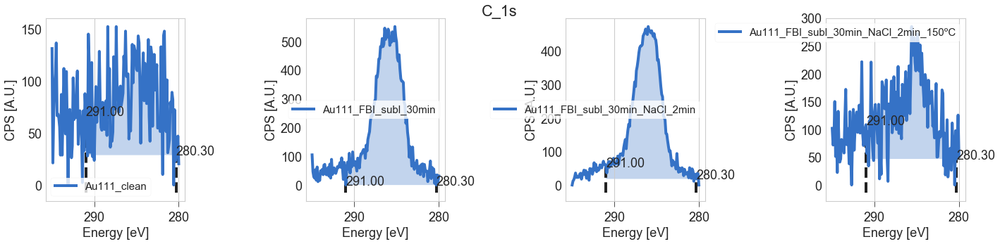

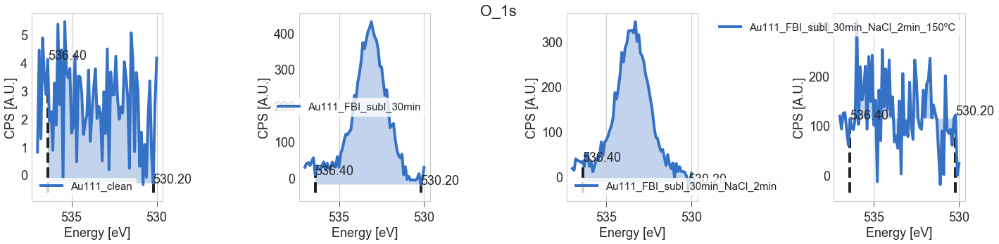

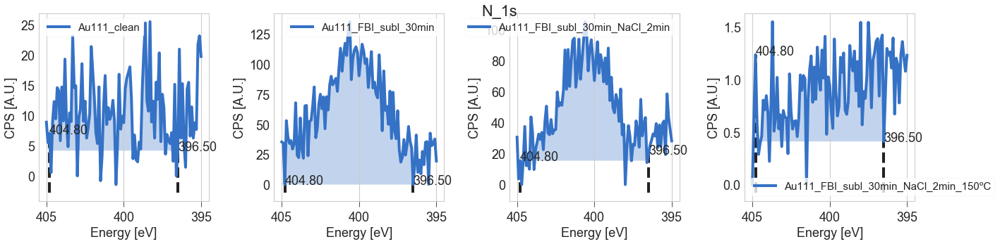

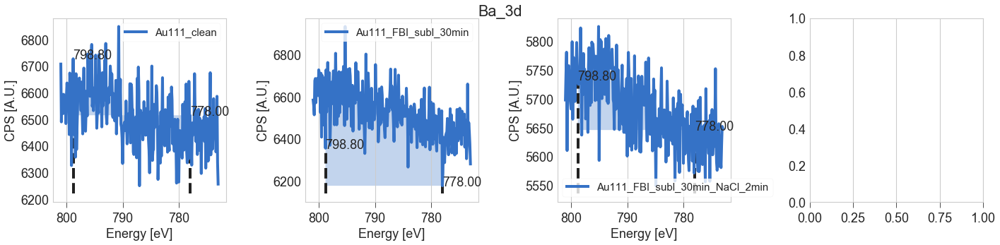

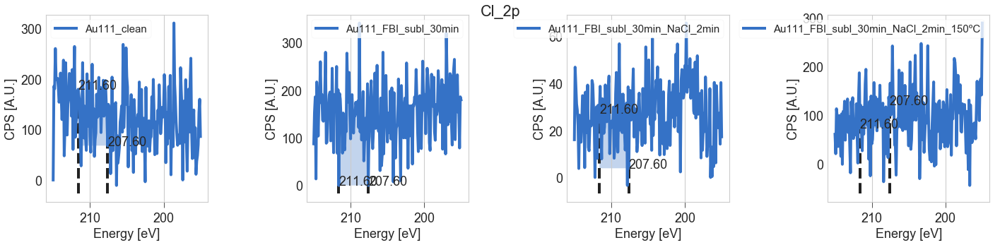

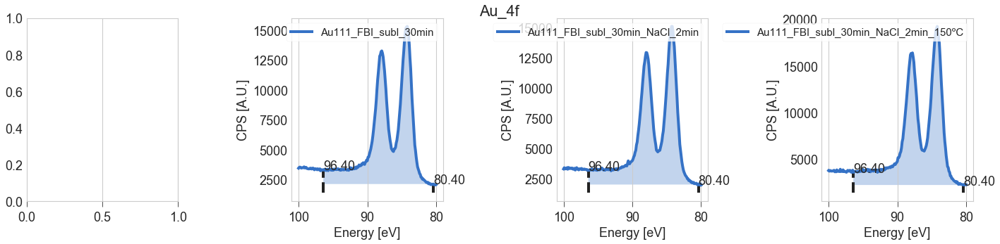

In [118]:
for r in regs:
    integrateRegions(samp1, r, asf=asf)

In [119]:
for xp in samp1:
    xp.area['FBI0'] = xp.area['N_1s'] / 3
    xp.area['FBI1'] = xp.area['O_1s'] / 5

In [99]:
num, denom = (('N_1s', 'C_1s', 'C_1s' ), ('O_1s', 'N_1s', 'O_1s',))
make_stoichometry_table(samp1,  num=num, denom=denom, sep=' \t ')

num, denom = ('Na_1s', 'Na_1s', 'Na_1s'), ( 'FBI0', 'N_1s', 'Cl_2p')
make_stoichometry_table([samp1[2]],  num=num, denom=denom, sep=' \t ')


Experiment	N_/O_	C_/N_	C_/O_	
Au111_clean 	 8.46  	  16.84  	  142.46  	  
Au111_FBI_subl_30min 	 0.95  	  6.61  	  6.25  	  
Au111_FBI_subl_30min_NaCl_2min 	 0.82  	  7.67  	  6.27  	  
Au111_FBI_subl_30min_NaCl_2min_150ºC 	 0.01  	  309.77  	  4.19  	  
Experiment	Na_/FBI	Na_/N_	Na_/Cl_	
Au111_FBI_subl_30min_NaCl_2min 	 2.60  	  0.87  	  6.64  	  


In [112]:
num, denom = ('Na_1s', 'Na_1s', 'Na_1s'), ( 'FBI0', 'FBI1', 'Cl_2p')
make_stoichometry_table([samp1[2]],  num=num, denom=denom, sep=' \t ')


Experiment	Na_/FBI	Na_/FBI	Na_/Cl_	
Au111_FBI_subl_30min_NaCl_2min 	 2.60  	  3.54  	  6.64  	  


In [121]:
samp1[2].area['Na_1s'] / samp1[1].area['FBI0']
samp1[2].area['Na_1s'] / samp1[1].area['FBI1']

3.0578055533701534

In [425]:
num, denom = (('N_1s', 'C_1s', 'C_1s', 'N_1s', 'Cl_2p'), ('O_1s', 'N_1s', 'O_1s', 'Na_1s', 'Na_1s'))
make_stoichometry_table(samp1[1:],  num=num, denom=denom, sep=' \t ')


Experiment	N_/O_	C_/N_	C_/O_	N_/Na_	Cl_/Na_	
Au111_FBI_subl_30min 	 0.95  	  6.61  	  6.25  	  27.13  	  15.15  	  
Au111_FBI_subl_30min_NaCl_2min 	 0.82  	  7.67  	  6.27  	  2.10  	  0.27  	  
Au111_FBI_subl_30min_NaCl_2min_150ºC 	 0.01  	  309.77  	  4.19  	  0.36  	  9.34  	  


In [94]:
 asf['N_1s']/asf['Na_1s'] / (asf2['N_1s']/asf2['Na_1s'])

1.339940652818991

In [108]:
9.82/2.60

1.258974358974359

### ASF 2

'Ba_3d' region does not exist in Au111_FBI_subl_30min_NaCl_2min_150ºC


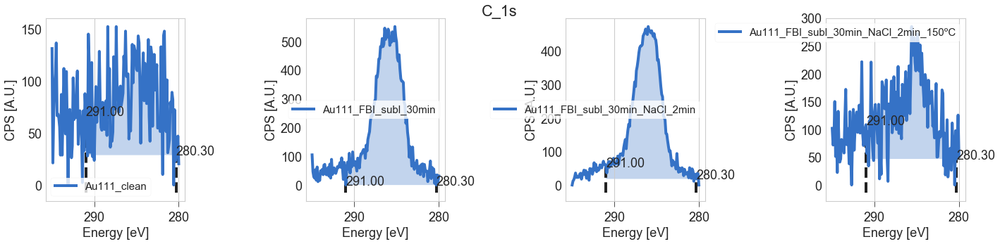

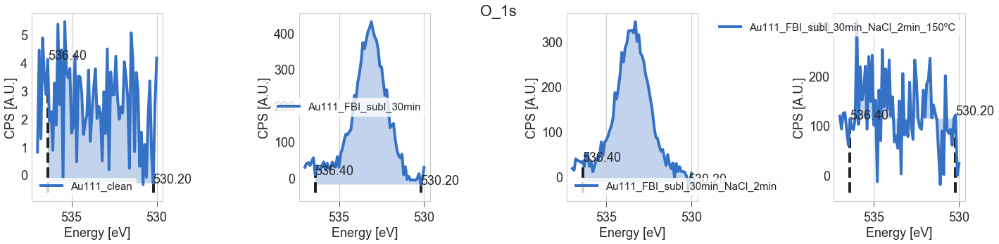

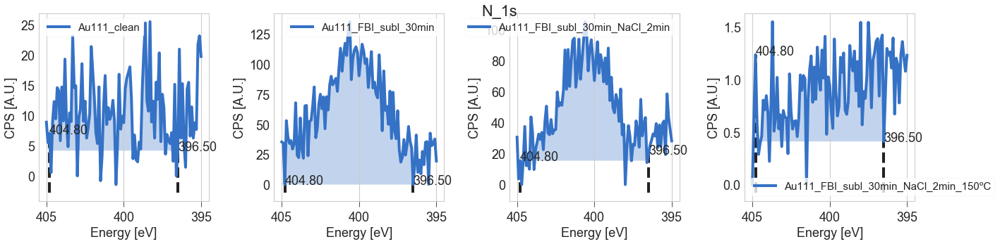

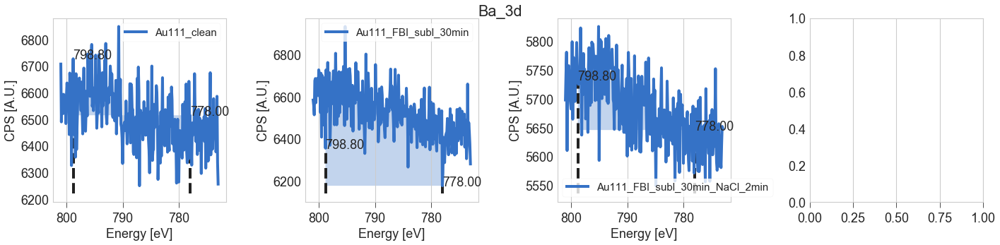

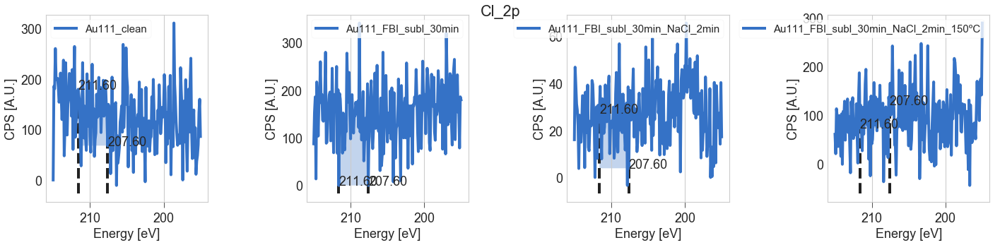

In [113]:
for r in regs[:-1]:
    integrateRegions(samp1, r, asf=asf2)

In [114]:
for xp in samp1:
    xp.area['FBI0'] = xp.area['N_1s'] / 3
    xp.area['FBI1'] = xp.area['O_1s'] / 5

In [106]:
num, denom = (('N_1s', 'C_1s', 'C_1s' ), ('O_1s', 'N_1s', 'O_1s',))
make_stoichometry_table(samp1,  num=num, denom=denom, sep=' \t ')

num, denom = ('Na_1s', 'Na_1s', 'Na_1s'), ( 'FBI0', 'N_1s', 'Cl_2p')
make_stoichometry_table([samp1[2]],  num=num, denom=denom, sep=' \t ')


Experiment	N_/O_	C_/N_	C_/O_	
Au111_clean 	 9.24  	  18.81  	  173.77  	  
Au111_FBI_subl_30min 	 1.03  	  7.38  	  7.63  	  
Au111_FBI_subl_30min_NaCl_2min 	 0.89  	  8.57  	  7.64  	  
Au111_FBI_subl_30min_NaCl_2min_150ºC 	 0.01  	  346.00  	  5.11  	  
Experiment	Na_/FBI	Na_/N_	Na_/Cl_	
Au111_FBI_subl_30min_NaCl_2min 	 9.82  	  3.27  	  17.00  	  


In [115]:
num, denom = ('Na_1s', 'Na_1s', 'Na_1s'), ( 'FBI0', 'FBI1', 'Cl_2p')
make_stoichometry_table([samp1[2]],  num=num, denom=denom, sep=' \t ')


Experiment	Na_/FBI	Na_/FBI	Na_/Cl_	
Au111_FBI_subl_30min_NaCl_2min 	 9.82  	  14.60  	  17.00  	  


## Coverages

In [411]:
# Coverage with FBI: IMFP = 1.86 nm
inds = [[1, 0]]
layers_fbi = arrange_coverages(samp1, inds,
                               r_ml = 1.1*nm, region='Au4f_MA', mfp = 3.87*nm, takeoff = 10)

# Coverage with BaCl2: IMFP = 1.35 nm
# Take previous stage (only FBI) as reference
inds = [[2, 1]]
layers_na = arrange_coverages(samp1, inds,
                               r_ml = 1*nm, region='Au4f_MA', mfp = 3.82*nm, takeoff = 10)

In [412]:
samp1[2].area['layers']

0.3155202081894444

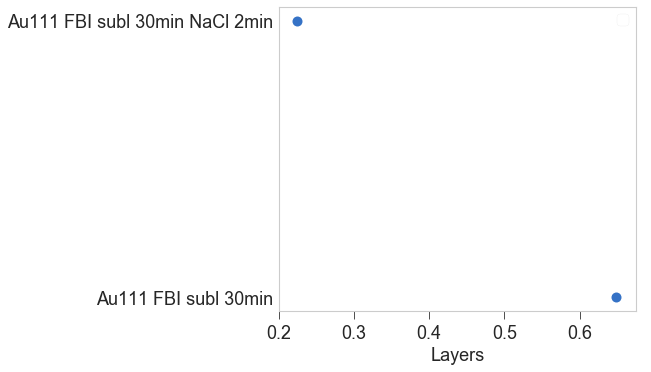

In [335]:
plot_coverages(samp1)

## Fits

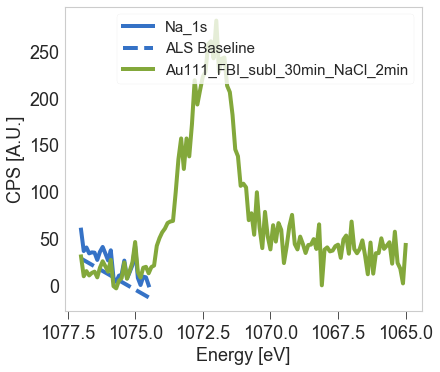

In [339]:
fix_tail_bg(samp1[2], 'Na_1s', edw=1074.5, inplace =True);

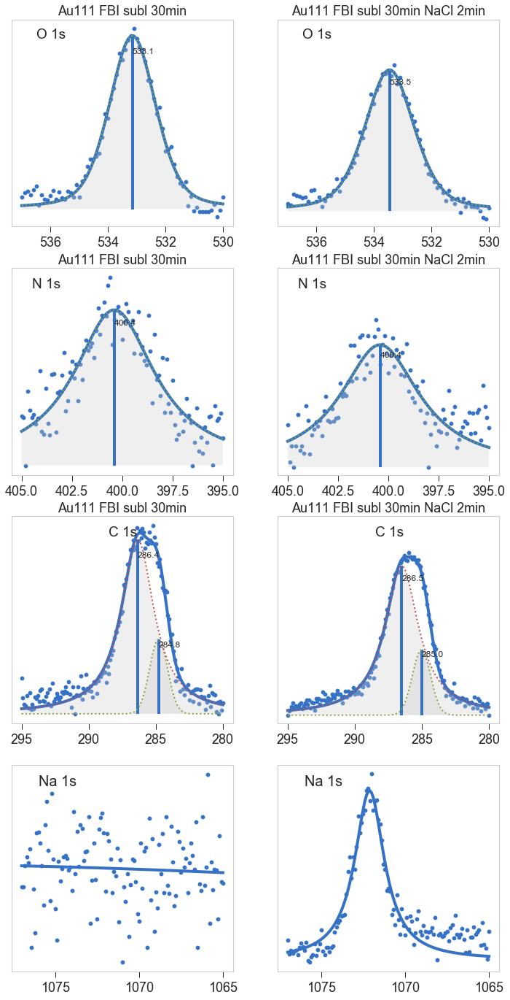

In [340]:
fig, ax = plt.subplots(4, 2, sharex=False, figsize=(12, 24), )

r = 'O_1s'
for i, xp in enumerate(samp1[1:3]):
    Fn = XPFit(xp, region = r)
#     Fn.preset_pars('v1_sigma', 0.92)
#     Fn.double_voigt(sepPt=531.5)
    Fn.voigt()
    Fn.set_areas()
    plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[0][i], offset=0,
                    flag_fill=True, plot_comps=True)
    ax[0][i].set(title=xp.name.replace('_', ' '), xlabel='', ylabel='', yticks=[], 
                 ylim=(ax[0][i].get_ylim()[0], ax[0][0].get_ylim()[1]))
    ax[0][i].invert_xaxis()
    ax[0][i].tick_params('both', length=8, width=1, which='major')
    ax[0][i].text(s='O 1s', x=536.5, y=ax[0][0].get_ylim()[1]*0.9, fontsize=19)

r = 'N_1s'
for i, xp in enumerate(samp1[1:3]):
    Fn = XPFit(xp, region = r)
#     Fn.preset_pars('v1_sigma', 0.92)
    Fn.voigt()
#     Fn.voigt()
    Fn.set_areas()
    plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[1][i], offset=0,
                    flag_fill=True, plot_comps=True)
    ax[1][i].set(title=xp.name.replace('_', ' '), xlabel='', ylabel='', yticks=[], 
                 ylim=(ax[1][i].get_ylim()[0], ax[1][0].get_ylim()[1]))
    ax[1][i].invert_xaxis()
    ax[1][i].tick_params('both', length=8, width=1, which='major')
    ax[1][i].text(s='N 1s', x=404.5, y=ax[1][0].get_ylim()[1]*0.9, fontsize=19)

r = 'C_1s'
for i, xp in enumerate(samp1[1:3]):
    Fn = XPFit(xp, region = r)
    if i == 2: Fn.preset_pars('v1_sigma', 1.033460)
    Fn.double_voigt(sepPt=286)
#     Fn.voigt()
    Fn.set_areas()
    plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[2][i], offset=0,
                    flag_fill=True, plot_comps=True)
    ax[2][i].set(title=xp.name.replace('_', ' '), xlabel='', ylabel='', yticks=[], 
                 ylim=(ax[2][i].get_ylim()[0], ax[2][0].get_ylim()[1]))
    ax[2][i].invert_xaxis()
    ax[2][i].tick_params('both', length=8, width=1, which='major')
    ax[2][i].text(s='C 1s', x=288.5, y=ax[2][0].get_ylim()[1]*0.9, fontsize=19)

r = 'Na_1s'
for i,xp in enumerate(samp1[1:3]):
    Fn = XPFit(xp, region = r)
    Fn.voigt()
    Fn.set_areas()
    li = plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[3][i], flag_fill=True, plot_comps=False)
    ax[3][i].set(xlabel='', ylabel='', yticks=[])
    ax[3][i].invert_xaxis()
    ax[3][i].tick_params('both', length=8, width=1, which='major',)
    ax[3][i].text(s='Na 1s', x=1076, y=ax[3][i].get_ylim()[1]*0.9, fontsize=20)

Modify user pars
Modify user pars
Modify user pars


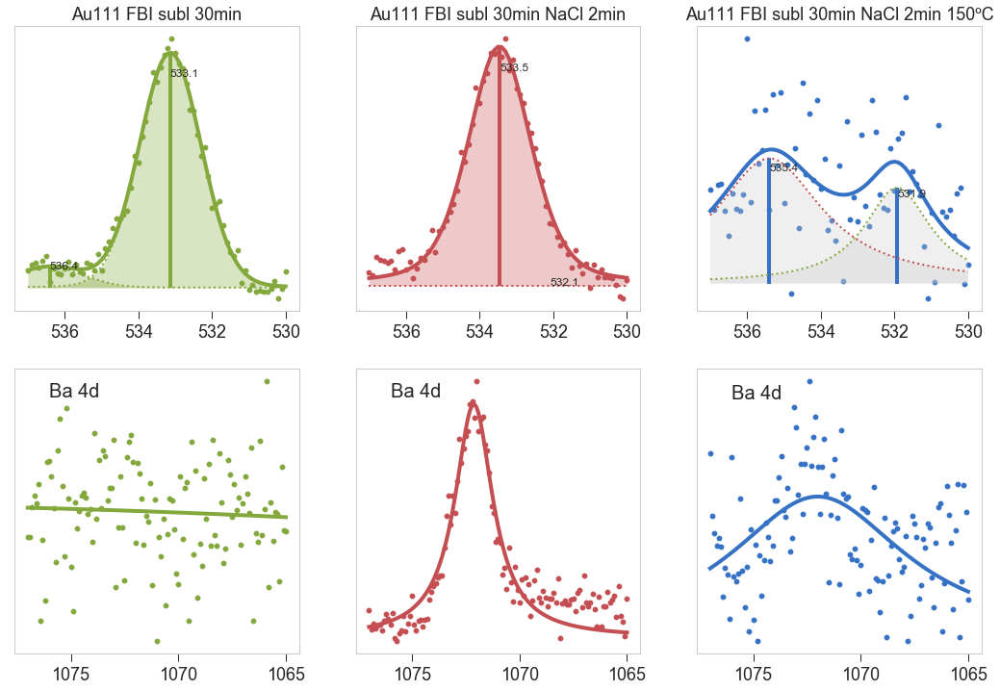

In [439]:
fig, ax = plt.subplots(2, 3, sharex=False, figsize=(18, 12), )

r = 'O_1s'
for i, xp in enumerate(samp1[1:]):
    Fn = XPFit(xp, region = r)
    if (i == 4):
        Fn.voigt()
    else:
        Fn.preset_pars('v1_sigma', 1.097)
        Fn.double_voigt(sepPt=532)
    Fn.set_areas()
    plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[0][i], offset=0,
                    flag_fill=True, plot_comps=True)
    ax[0][i].set(title=xp.name.replace('_', ' '), xlabel='', ylabel='', yticks=[])
    ax[0][i].invert_xaxis()
    ax[0][i].tick_params('both', length=8, width=1, which='major')
#     ax[0][i].text(s='O 1s', x=537.5, y=ax[0][0].get_ylim()[1]*0.9, fontsize=20)

r = 'Na_1s'

for i,xp in enumerate(samp1[1:]):
    Fn = XPFit(xp, region = r)
    Fn.voigt()
#     else:    Fn.double_voigt(sepPt=92.5)
    Fn.set_areas()
    li = plot_fit_result(xp, r, fitRes=xp.fit[r], ax=ax[1][i], flag_fill=True, plot_comps=False)
    ax[1][i].set(xlabel='', ylabel='', yticks=[])
    ax[1][i].invert_xaxis()
    ax[1][i].tick_params('both', length=8, width=1, which='major',)
    ax[1][i].text(s='Na 1s', x=1076, y=ax[1][i].get_ylim()[1]*0.9, fontsize=20)
# plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
# ax[0][0].legend(list(li.get_lines()), labels = [xp.name for xp in samp1[:0:-1]], ncol=len(selection),
#             loc="upper left", bbox_to_anchor=(0.1, 1.2))  

In [17]:
samp1[1].color = 'g'
samp1[2].color = 'k'

[[]]

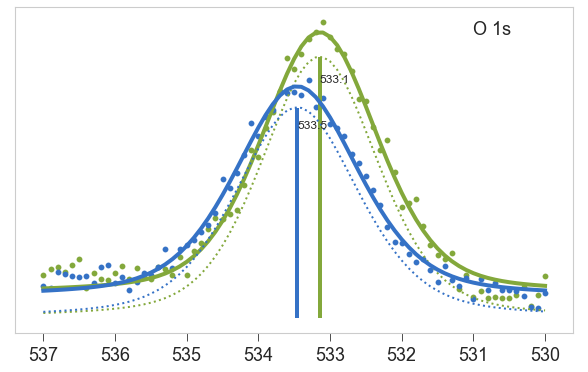

In [357]:
plt.figure(figsize=(10, 6))
plot_fit_result(samp1[1], 'O_1s')
plot_fit_result(samp1[2], 'O_1s')
plt.text(s='O 1s', x=531, y = 450)
plt.gca().invert_xaxis()
plt.gca().set(yticks=[])
# plt.legend()

[[]]

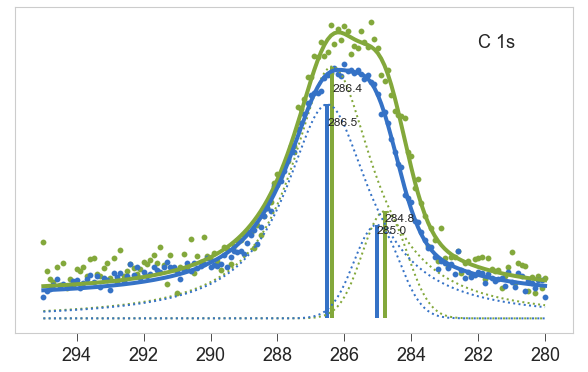

In [356]:
region = 'C_1s'
plt.figure(figsize=(10, 6))
plot_fit_result(samp1[1], region)
plot_fit_result(samp1[2], region)
plt.text(s=region.replace('_',' '), x=282, y = 550)
plt.gca().invert_xaxis()
plt.gca().set(yticks=[])
# plt.legend()

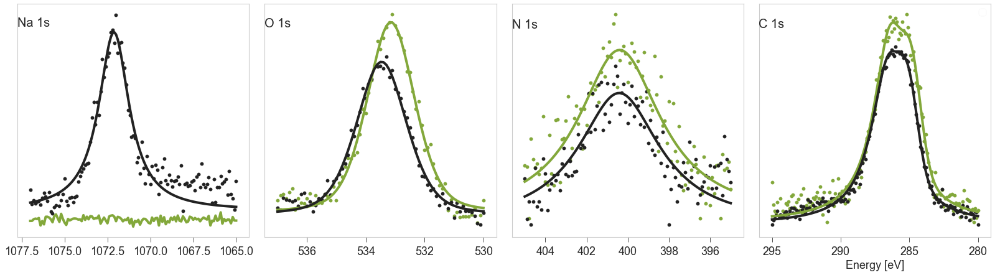

In [19]:
regions = ['Na_1s', 'O_1s', 'N_1s', 'C_1s']
fig, ax = plt.subplots(1, 4, figsize=(22, 6))
for i, region in enumerate(regions):
    if i == 0:
        plot_region(samp1[1], region, ax=ax[i])
    else:
        plot_fit_result(samp1[1], region, ax=ax[i], plot_comps=False)
    plot_fit_result(samp1[2], region, ax=ax[i], plot_comps=False)

    ax[i].invert_xaxis()
    if i == 3:
        ax[i].text(s=region.replace('_',' '), x=296, y = ax[i].get_ylim()[1]*0.9, fontsize=20)
    else: 
        ax[i].text(s=region.replace('_',' '), x=ax[i].get_xlim()[0], y = ax[i].get_ylim()[1]*0.9, fontsize=20)
        
    ax[i].set(yticks=[])
ax[i].set(ylabel=None)
ax[i].invert_xaxis()

plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)
    
# plt.legend(loc='upper left')

In [341]:
for xp in samp1:
    write_processed_xp(xp.path, xp)

Storing of file /Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/proc/20210507_Au111_clean.uxy.ft successful
Storing of file /Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/proc/20210507_Au111_FBI_subl_30min.uxy.ft successful
Storing of file /Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/proc/20210508_Au111_FBI_subl_30min_NaCl_2min.uxy.ft successful
Storing of file /Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/proc/20210508_Au111_FBI_subl_30min_NaCl_2min_150ºC.uxy.ft successful


# All samples O 1s shoulder vs Ba layers

In [165]:
samp17[1].name

'FBI_60min'

In [137]:
np.sqrt(xp.area['O_1s_v1_'] * (xp.area['O_1s']) ) / xp.area['O_1s']

0.014388008144192384

In [185]:
for xp in samp12[1:6:3]:
    print(xp.name)

11-Cu_FBI_subl_20min_BaCl2_2min
12-Cu_FBI_subl_20min_BaCl2_4min


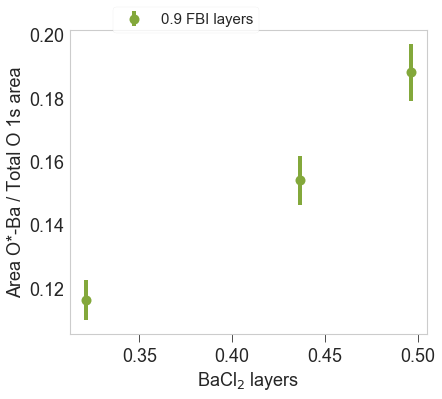

In [194]:
cov12, shoulder12, dshoulder12 = [], [], []
for xp in samp12[1:6:3]:
    cov12.append(xp.area['layers'])
    shoulder12.append(xp.area['O_1s_v1_'])
    dshoulder12.append(np.sqrt(xp.area['O_1s_v1_'] * (xp.area['O_1s']) ) / xp.area['O_1s'] )

# plt.errorbar(x=cov12, y=shoulder12, yerr=dshoulder12, fmt='o',ms=10, label='%.1f FBI layers' %samp12[0].area['layers'])

cov13, shoulder13, dshoulder13 = [], [], []
for xp in samp13[2:]:
    cov13.append(xp.area['layers'])
    shoulder13.append(xp.area['O_1s_v1_'])
    dshoulder13.append(np.sqrt(xp.area['O_1s_v1_'] * (xp.area['O_1s']) ) / xp.area['O_1s'] )

plt.errorbar(x=cov13, y=shoulder13, yerr=dshoulder13, fmt='go',ms=10, label='%.1f FBI layers' %samp13[1].area['layers'])
# plt.plot(cov13, shoulder13, 'og', ms=10, label='%.1f FBI layers' %samp13[1].area['layers'])
plt.xlabel('BaCl$_2$ layers')
plt.ylabel('Area O*-Ba / Total O 1s area')
plt.gca().legend(loc="upper left", bbox_to_anchor=(0.1, 1.1))  

FBI_60min_BaCl2_1min
FBI_60min_BaCl2_2min
FBI_60min_BaCl2_6min


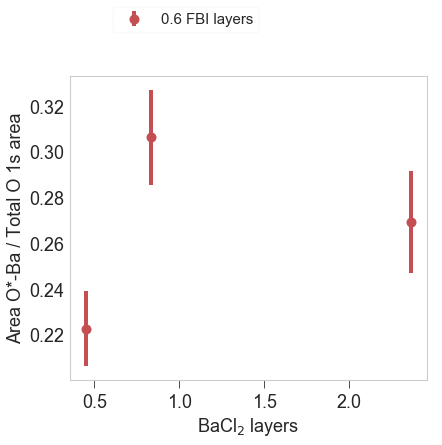

In [190]:
cov16, shoulder16, dshoulder16 = [], [], []
for xp in subml[2:5]:
    cov16.append(xp.area['layers'])
    shoulder16.append(xp.area['O_1s_v1_'])
    dshoulder16.append(np.sqrt(xp.area['O_1s_v1_'] * (xp.area['O_1s']) ) / xp.area['O_1s'] )
    
plt.errorbar(x=cov16, y=shoulder16, yerr=dshoulder16, fmt='ro',ms=10, label='%.1f FBI layers' %subml[1].area['layers'])

cov17, shoulder17, dshoulder17 = [], [], []
for xp in samp17[2:5]:
    print(xp.name)
    cov17.append(xp.area['layers'])
    shoulder17.append(xp.area['O_1s_v1_'])
    dshoulder17.append(np.sqrt(xp.area['O_1s_v1_'] * (xp.area['O_1s']) ) / xp.area['O_1s'] )
    
# plt.errorbar(x=cov17, y=shoulder17, yerr=dshoulder17, fmt='ok',ms=10, label='%.1f FBI layers' %samp17[1].area['layers'])
plt.xlabel('BaCl$_2$ layers')
plt.ylabel('Area O*-Ba / Total O 1s area')
plt.gca().legend(loc="upper left", bbox_to_anchor=(0.1, 1.25))  

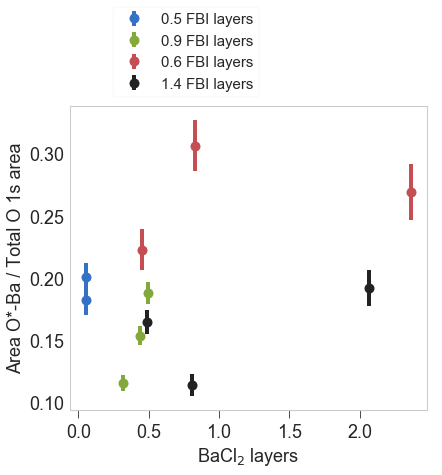

In [187]:
plt.errorbar(x=cov12, y=shoulder12, yerr=dshoulder12, fmt='o',ms=10, label='%.1f FBI layers' %samp12[0].area['layers'])
plt.errorbar(x=cov13, y=shoulder13, yerr=dshoulder13, fmt='o',ms=10, label='%.1f FBI layers' %samp13[1].area['layers'])
plt.errorbar(x=cov16, y=shoulder16, yerr=dshoulder16, fmt='ro',ms=10, label='%.1f FBI layers' %subml[1].area['layers'])
plt.errorbar(x=cov17, y=shoulder17, yerr=dshoulder17, fmt='ok',ms=10, label='%.1f FBI layers' %samp17[1].area['layers'])
plt.xlabel('BaCl$_2$ layers')
plt.ylabel('Area O*-Ba / Total O 1s area')
plt.gca().legend(loc="upper left", bbox_to_anchor=(0.1, 1.35))  

# Chloride desorption 

In [7]:
path = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/Cl_desorption/Cl_scans/*.xy'
files = glob.glob(path)
files.sort()
files[1], files[2] = files[2], files[1]

In [8]:
def read_scan_acquisition_time(path):
    with open(path) as infile:
        read_time = []
        for i,line in enumerate(infile):
            if ('# Acquisition Date:' in line) and (i > 19):
                rt = line[20:-1]
                read_time.append(datetime.datetime.strptime(rt, '%m/%d/%y %H:%M:%S UTC') )
    return read_time

def import_multiscan_df(path, skipRows0, nrows0, regions):
    frames = []
    nscans = []
    for j, sk in enumerate(skipRows0[:-1]):
        if j < len(skipRows0):
            frames.append(pd.read_table(path, sep='\s+', skiprows=sk+2, nrows = nrows0[0], header=None, names=[regions[0], 'counts'],
                                            decimal='.', encoding='ascii', engine='python'))
            nscans.append(str(regions[0]+'_scan'+str(j).zfill(2)))

    dfx = pd.concat(frames, axis=1)

    index2 = np.array(['energy', 'counts'])

    mi = pd.MultiIndex.from_product([nscans, index2], names=['range', 'properties'])
    mi.to_frame()
    dfx.columns = mi

    return dfx

def import_multiscan_xp(path:str, name:str = None, label:str = None, color:str =None) ->XPS_experiment:
    import re
    """Separate scans in a xy file into XPS_experiment dfx"""
    delimiters = xy_region_delimiters(path) # Finds all skipRows0 but single nrows0 and region name
    skipRows0, nrows0, regions = delimiters[:]
    
    dfx = import_multiscan_df(path, skipRows0, nrows0, regions)

    relpath, filename = os.path.split(path)
    dir_name = os.path.split(relpath)[1]
    da = re.search('\d+_', filename).group(0).replace('/', '').replace('_', '')
    if da[:4] != '2020':
        date = re.sub('(\d{2})(\d{2})(\d{4})', r"\1.\2.\3", da, flags=re.DOTALL)
    else:
        date = re.sub('(\d{4})(\d{2})(\d{2})', r"\1.\2.\3", da, flags=re.DOTALL)

    other_meta = filename.replace(da, '')[1:].strip('.xy')
    if name == None: name = other_meta
    if label == None: label = da+'_'+other_meta

    return XPS_experiment(path = path, dfx = dfx, delimiters = delimiters, color = color,
                          name = name, label = label, date = date, other_meta = other_meta, fit={})

In [219]:
clxp = [import_multiscan_xp(f) for f in files]

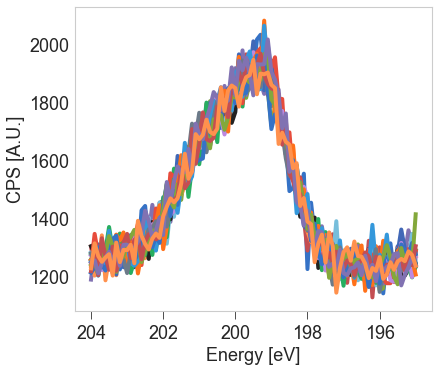

In [115]:
nscans = clxp[1].dfx.columns.levels[0].values
for scan in nscans:
    ax = plot_region(clxp[1], scan, )
    plt.gca().get_legend().remove()

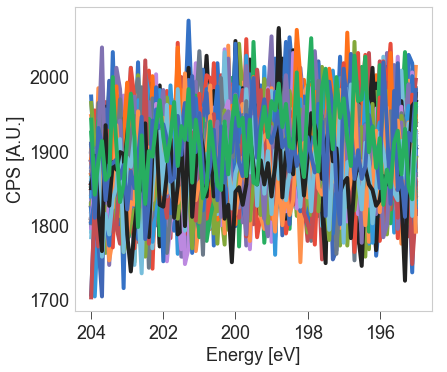

In [116]:
nscans = clxp[2].dfx.columns.levels[0].values
for scan in nscans:
    ax = plot_region(clxp[2], scan, )
    plt.gca().get_legend().remove()

'Cl_2p_scan0'

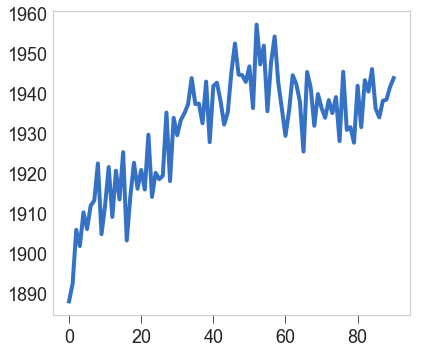

In [121]:
nscans = clxp[2].dfx.columns.levels[0].values

yi = xp.dfx[nscans[0]].dropna().counts
for scan in nscans:
    counts = clxp[2].dfx[scan].dropna().counts
    yi += counts
yi /= len(nscans)
plt.plot(yi)

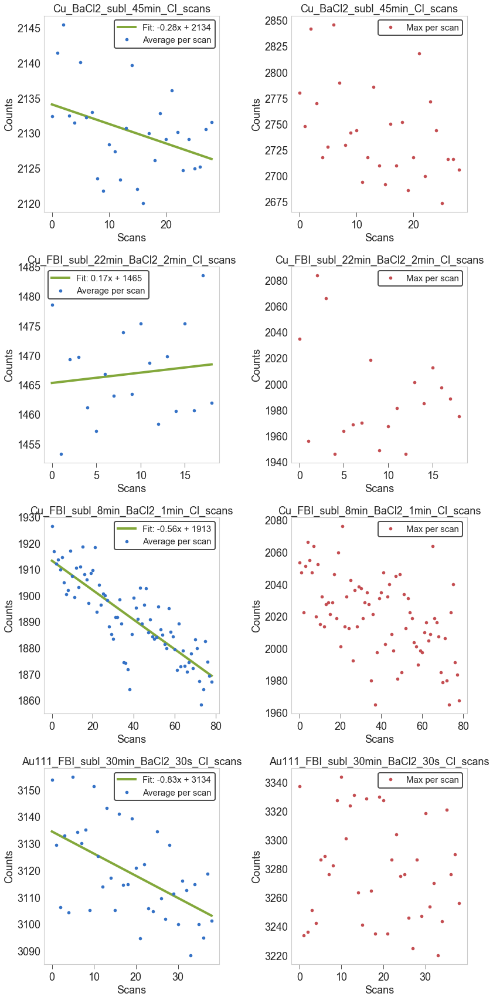

In [156]:
nexp = len(clxp)
fig, ax = plt.subplots(nexp, 2, sharex=False, figsize=(12, 24))

for i,xp in enumerate(clxp):
    nscans = xp.dfx.columns.levels[0].values
    scanavg = []
    scanmx = []

    for scan in nscans:
        counts = xp.dfx[scan].dropna().counts.values
        scanavg.append(np.average(counts))
        scanmx.append(np.max(counts))
    x = range(len(scanavg))
    model = np.polyfit(x, scanavg, 1)
    y = np.poly1d(model)
    ax[i][0].plot(x, y(x), '-g', label='Fit: %.2fx + %i' %tuple(model))
    ax[i][0].plot(scanavg, 'o', label='Average per scan')
    ax[i][1].plot(scanmx, 'or', label='Max per scan')
    for a in ax[i]: 
        leg = a.legend()
        leg.get_frame().set_edgecolor('k')
        leg.get_frame().set_linewidth(2)
        
        a.set(ylabel='Counts', xlabel='Scans', title=xp.name)
plt.tight_layout()

In [146]:
clxp[2].path

'/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/Cl_desorption/20210205_Cu_FBI_subl_8min_BaCl2_1min_Cl_scans.xy'

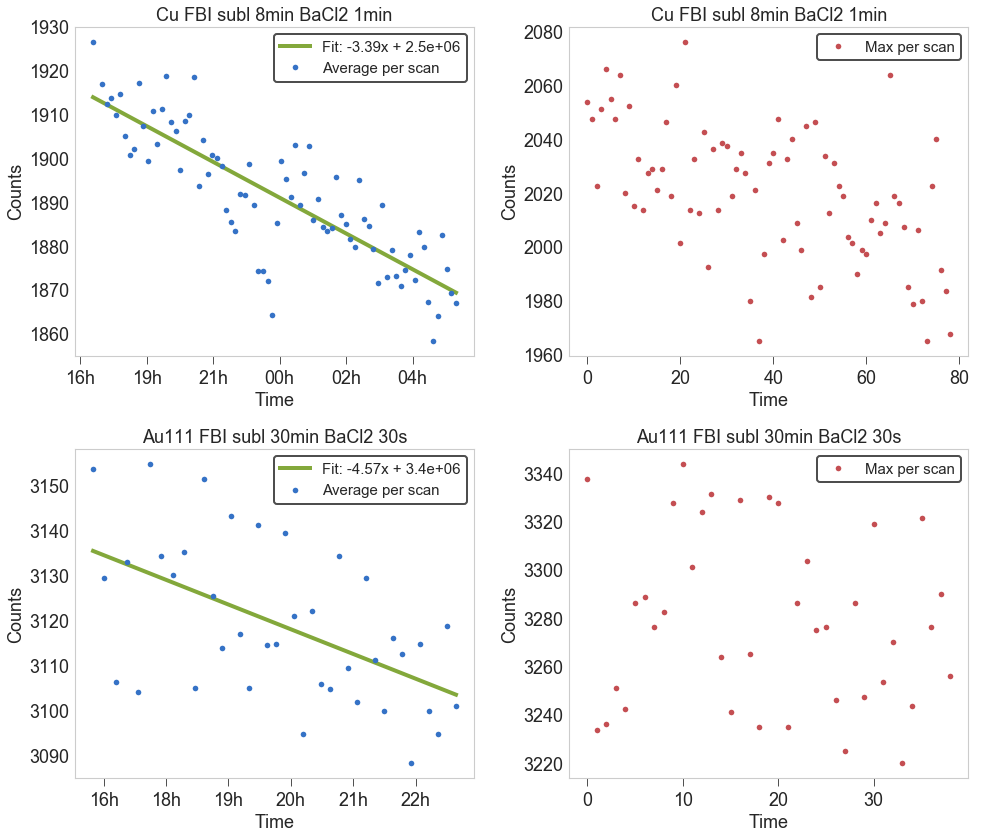

In [190]:
import matplotlib.dates as mdates
fig, ax = plt.subplots(2, 2, sharex=False, figsize=(14, 12))

for i,xp in enumerate(clxp[2:]):
    rt = read_scan_acquisition_time(xp.path)
    nscans = xp.dfx.columns.levels[0].values
    scanavg = []
    scanmx = []
    for scan in nscans:
        counts = xp.dfx[scan].dropna().counts.values
        scanavg.append(np.average(counts))
        scanmx.append(np.max(counts))
#     x = range(len(scanavg))
    x = mdates.date2num(rt[:-1])

    model = np.polyfit(x, scanavg, 1)
    y = np.poly1d(model)
    ax[i][0].plot(x, y(x), '-g', label='Fit: %.2fx + %.1e' %(model[0]/24, model[1]/24))
    ax[i][0].plot(x, scanavg, 'o', label='Average per scan')
    ax[i][1].plot(scanmx, 'or', label='Max per scan')
    ax[i][0].set_xticklabels(rt[:-1])
    
    ax[i][0].xaxis.set_major_formatter(mdates.DateFormatter('%Hh'))
    for a in ax[i]: 
        leg = a.legend()
        leg.get_frame().set_edgecolor('k')
        leg.get_frame().set_linewidth(2)
        
        a.set(ylabel='Counts', xlabel='Time', title=xp.name.replace('_Cl_scans','').replace('_', ' '))
plt.tight_layout()

## Check other regions for same file

In [9]:
path = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/Cl_desorption/2021_02_05/*.xy'
filesCu = glob.glob(path)
xpdesorp = [import_multiscan_xp(f) for f in filesCu]

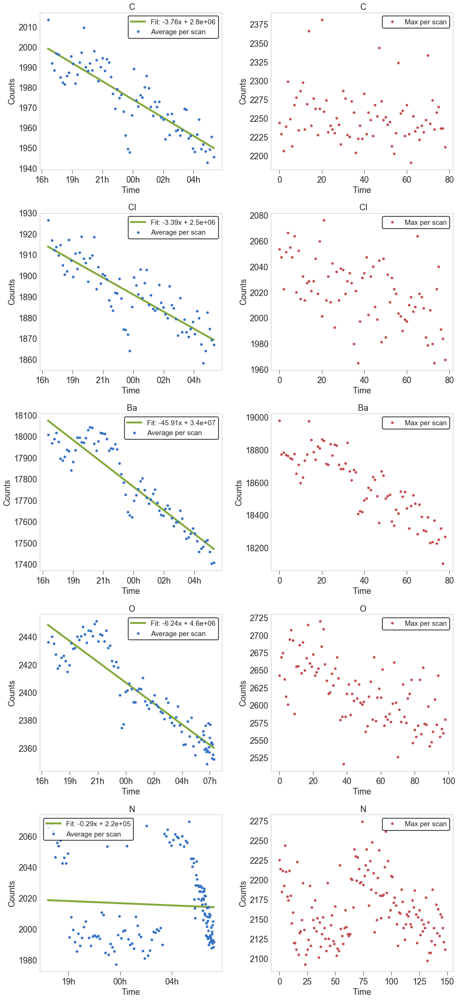

In [10]:
import matplotlib.dates as mdates
regs = len(xpdesorp)
fig, ax = plt.subplots(regs, 2, sharex=False, figsize=(14, 6*regs))

for i,xp in enumerate(xpdesorp):
    rt = read_scan_acquisition_time(xp.path)
    nscans = xp.dfx.columns.levels[0].values
    scanavg = []
    scanmx = []
    for scan in nscans:
        counts = xp.dfx[scan].dropna().counts.values
        scanavg.append(np.average(counts))
        scanmx.append(np.max(counts))
#     x = range(len(scanavg))
    x = mdates.date2num(rt[:-1])

    model = np.polyfit(x, scanavg, 1)
    y = np.poly1d(model)
    ax[i][0].plot(x, y(x), '-g', label='Fit: %.2fx + %.1e' %(model[0]/24, model[1]/24))
    ax[i][0].plot(x, scanavg, 'o', label='Average per scan')
    ax[i][1].plot(scanmx, 'or', label='Max per scan')
    ax[i][0].set_xticklabels(rt[:-1])
    
    ax[i][0].xaxis.set_major_formatter(mdates.DateFormatter('%Hh'))
    for a in ax[i]: 
        leg = a.legend()
        leg.get_frame().set_edgecolor('k')
        leg.get_frame().set_linewidth(2)
        
        a.set(ylabel='Counts', xlabel='Time', title=xp.name.replace('Cu_FBI_subl_8min_BaCl2_1min', '').replace('_scans','').replace('_', ' '))
plt.tight_layout()

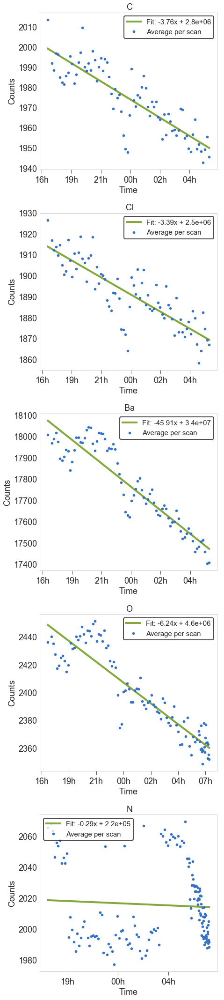

In [12]:
import matplotlib.dates as mdates
regs = len(xpdesorp)
fig, ax = plt.subplots(regs, sharex=False, figsize=(7, 6*regs))

for i,xp in enumerate(xpdesorp):
    rt = read_scan_acquisition_time(xp.path)
    nscans = xp.dfx.columns.levels[0].values
    scanavg = []
    scanmx = []
    for scan in nscans:
        counts = xp.dfx[scan].dropna().counts.values
        scanavg.append(np.average(counts))
        scanmx.append(np.max(counts))
#     x = range(len(scanavg))
    x = mdates.date2num(rt[:-1])

    model = np.polyfit(x, scanavg, 1)
    y = np.poly1d(model)
    ax[i].plot(x, y(x), '-g', label='Fit: %.2fx + %.1e' %(model[0]/24, model[1]/24))
    ax[i].plot(x, scanavg, 'o', label='Average per scan')
    
    ax[i].xaxis.set_major_formatter(mdates.DateFormatter('%Hh'))
    leg = ax[i].legend()
    leg.get_frame().set_edgecolor('k')
    leg.get_frame().set_linewidth(2)
        
    ax[i].set(ylabel='Counts', xlabel='Time', title=xp.name.replace('Cu_FBI_subl_8min_BaCl2_1min', '').replace('_scans','').replace('_', ' '))
plt.tight_layout()